<a href="https://colab.research.google.com/github/sammywenthikingwithshroomtrolls/Cyclone-Test/blob/main/Cyclone_Dana_Analysis_%26_Alert_Triggering_from_ERA5_Reanalysis_Data_(Bangladesh%2C_Oct_2024).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [16]:
!pip install xarray netCDF4 matplotlib pandas scikit-learn

In [17]:
import xarray as xr
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler  # Optional for normalization

In [18]:
# Replace 'your_data.nc' with your uploaded NetCDF file path
import xarray as xr

# Open all datasets
ds_accum = xr.open_dataset('/content/data_stream-oper_stepType-accum.nc')
ds_avg = xr.open_dataset('/content/data_stream-oper_stepType-avg.nc')
ds_inst = xr.open_dataset('/content/data_stream-oper_stepType-instant.nc')
ds_wave = xr.open_dataset('/content/data_stream-wave_stepType-instant.nc')


In [19]:
# Check variables in each
print("Accumulated:", list(ds_accum.data_vars))
print("Averaged:", list(ds_avg.data_vars))
print("Instantaneous:", list(ds_inst.data_vars))
print("Wave:", list(ds_wave.data_vars))

Accumulated: ['e']
Averaged: ['avg_pevr']
Instantaneous: ['u10', 'v10', 'msl', 'sst', 'tcc']
Wave: ['swh', 'rhoao', 'cdww']


In [20]:
# Merge everything into one combined dataset
ds_combined = xr.merge([ds_accum, ds_avg, ds_inst, ds_wave], compat='override')
ds_combined

<xarray.Dataset> Size: 5MB
Dimensions:     (valid_time: 27, latitude: 69, longitude: 61)
Coordinates:
  * valid_time  (valid_time) datetime64[ns] 216B 2024-10-22 ... 2024-10-24T23...
  * latitude    (latitude) float64 552B 5.0 5.25 5.5 5.75 ... 21.5 21.75 22.0
  * longitude   (longitude) float64 488B 80.0 80.25 80.5 ... 94.5 94.75 95.0
    number      int64 8B ...
    expver      (valid_time) <U4 432B ...
Data variables:
    e           (valid_time, latitude, longitude) float32 455kB ...
    avg_pevr    (valid_time, latitude, longitude) float32 455kB ...
    u10         (valid_time, latitude, longitude) float32 455kB ...
    v10         (valid_time, latitude, longitude) float32 455kB ...
    msl         (valid_time, latitude, longitude) float32 455kB ...
    sst         (valid_time, latitude, longitude) float32 455kB ...
    tcc         (valid_time, latitude, longitude) float32 455kB ...
    swh         (valid_time, latitude, longitude) float32 455kB 1.602 ... nan
    rhoao       (valid_time, latitude, longitude) float32 455kB 1.159 ... nan
    cdww        (valid_time, latitude, longitude) float32 455kB 0.0011 ... nan
Attributes:
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    GRIB_subCentre:          0
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts
    history:                 2025-06-01T16:04 GRIB to CDM+CF via cfgrib-0.9.1...

In [21]:
print(ds_combined.dims)
print(ds_combined.coords)

FrozenMappingWarningOnValuesAccess({'valid_time': 27, 'latitude': 69, 'longitude': 61})
Coordinates:
  * valid_time  (valid_time) datetime64[ns] 216B 2024-10-22 ... 2024-10-24T23...
  * latitude    (latitude) float64 552B 5.0 5.25 5.5 5.75 ... 21.5 21.75 22.0
  * longitude   (longitude) float64 488B 80.0 80.25 80.5 ... 94.5 94.75 95.0
    number      int64 8B ...
    expver      (valid_time) <U4 432B ...


In [22]:
ds_combined['u10']
ds_combined['v10']
ds_combined['msl']
ds_combined['sst']
ds_combined['swh']
ds_combined['u10']

<xarray.DataArray 'u10' (valid_time: 27, latitude: 69, longitude: 61)> Size: 455kB
[113643 values with dtype=float32]
Coordinates:
  * valid_time  (valid_time) datetime64[ns] 216B 2024-10-22 ... 2024-10-24T23...
  * latitude    (latitude) float64 552B 5.0 5.25 5.5 5.75 ... 21.5 21.75 22.0
  * longitude   (longitude) float64 488B 80.0 80.25 80.5 ... 94.5 94.75 95.0
    number      int64 8B ...
    expver      (valid_time) <U4 432B ...
Attributes: (12/32)
    GRIB_paramId:                             165
    GRIB_dataType:                            an
    GRIB_numberOfPoints:                      4209
    GRIB_typeOfLevel:                         surface
    GRIB_stepUnits:                           1
    GRIB_stepType:                            instant
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_units:                               m s**-1
    long_name:                                10 metre U wind component
    units:                                    m s**-1
    standard_name:                            unknown
    GRIB_surface:                             0.0

In [23]:
print(ds_combined.data_vars)

Data variables:
    e         (valid_time, latitude, longitude) float32 455kB ...
    avg_pevr  (valid_time, latitude, longitude) float32 455kB ...
    u10       (valid_time, latitude, longitude) float32 455kB ...
    v10       (valid_time, latitude, longitude) float32 455kB ...
    msl       (valid_time, latitude, longitude) float32 455kB ...
    sst       (valid_time, latitude, longitude) float32 455kB ...
    tcc       (valid_time, latitude, longitude) float32 455kB ...
    swh       (valid_time, latitude, longitude) float32 455kB 1.602 nan ... nan
    rhoao     (valid_time, latitude, longitude) float32 455kB 1.159 nan ... nan
    cdww      (valid_time, latitude, longitude) float32 455kB 0.0011 nan ... nan


In [24]:
# Calculate wind speed
ds_combined['wind_speed'] = np.sqrt(ds_combined['u10']**2 + ds_combined['v10']**2)

In [25]:
# Choose one time slice (you can print(ds_combined.time.values) to see available times)
time_index = 0

# Plot wind speed
ds_combined['wind_speed'].isel(time=time_index).plot(cmap='plasma')

ValueError: Dimensions {'time'} do not exist. Expected one or more of ('valid_time', 'latitude', 'longitude')

'time' doesn't exist. it's 'valid_time'

In [26]:
print(ds_combined.dims)

FrozenMappingWarningOnValuesAccess({'valid_time': 27, 'latitude': 69, 'longitude': 61})


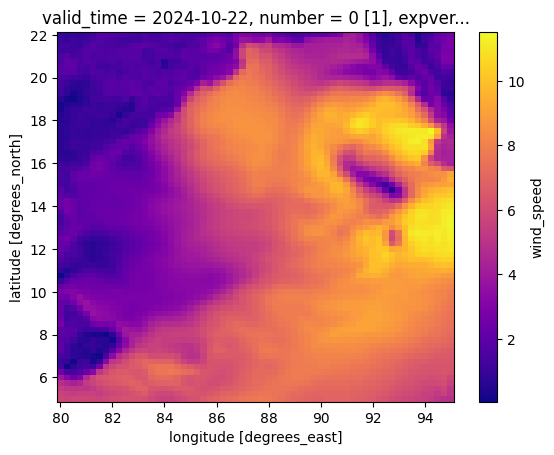

In [27]:
# Use the correct time dimension name
time_index = 0

# Plot wind speed
ds_combined['wind_speed'].isel(valid_time=time_index).plot(cmap='plasma')

AttributeError: QuadMesh.set() got an unexpected keyword argument 'interpolation'

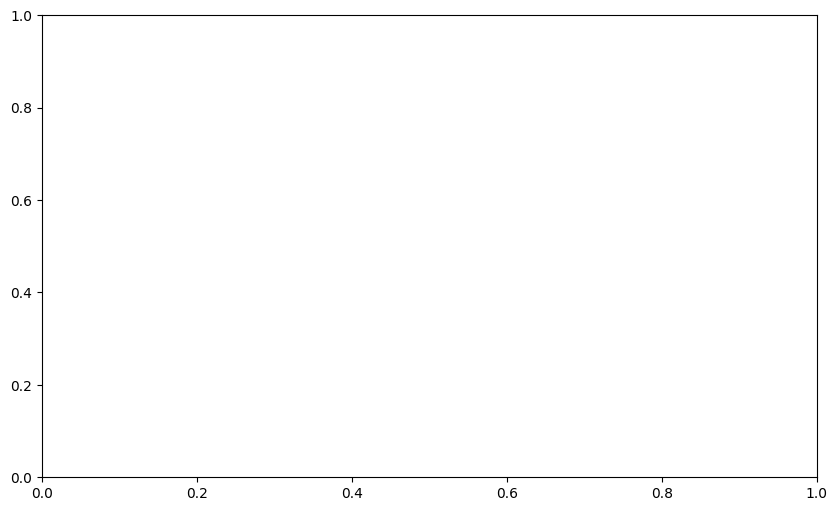

In [28]:
ds_combined['wind_speed'].isel(valid_time=time_index).plot(
    cmap='plasma',
    robust=True,
    interpolation='bilinear',  # Smooths the plot
    figsize=(10, 6)            # Optional: larger size = cleaner look
)

got this error because the interpolation='bilinear' argument does not work with .plot() in xarray when it uses a QuadMesh (which is the default for 2D data)


✅ Why it happened
xarray.plot() uses Matplotlib's pcolormesh(), which creates a QuadMesh object.

QuadMesh doesn’t accept the interpolation argument — it only works with imshow().



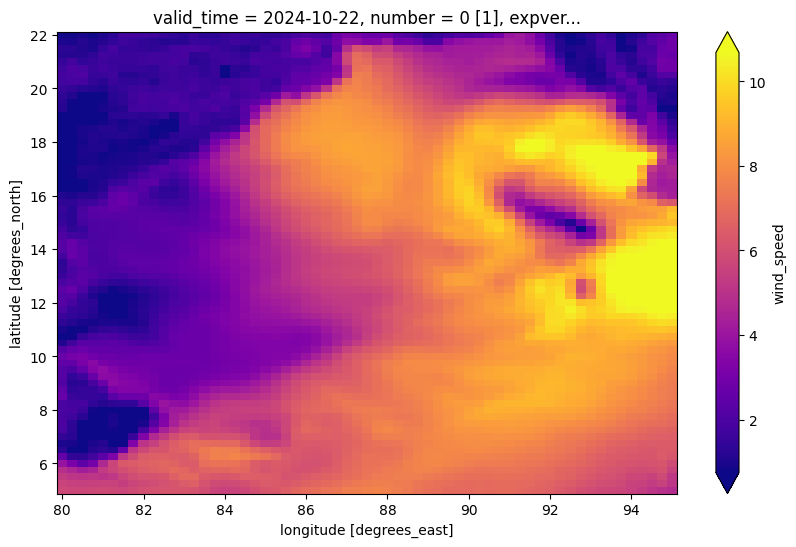

In [29]:
ds_combined['wind_speed'].isel(valid_time=time_index).plot(
    cmap='plasma',
    robust=True,
    figsize=(10, 6)  # Makes it visually smoother
)

Just made it bigger -_-

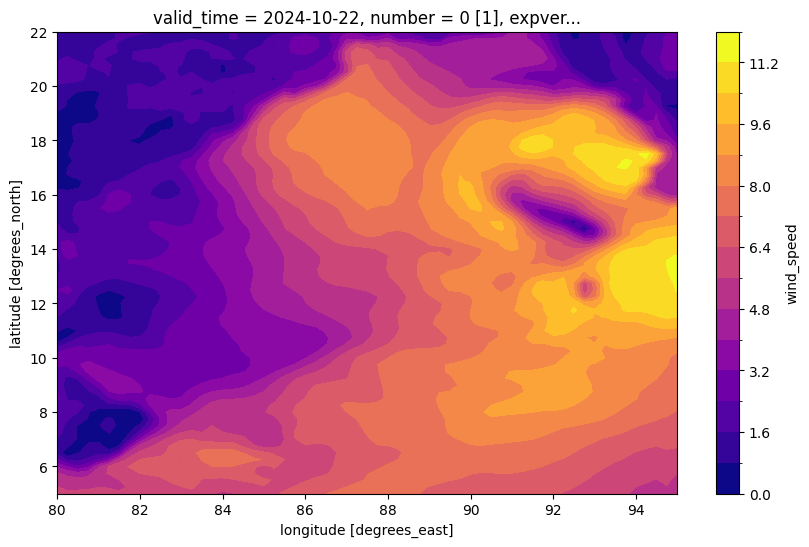

In [30]:
ds_combined['wind_speed'].isel(valid_time=time_index).plot.contourf(
    cmap='plasma',
    levels=20,
    figsize=(10, 6)
)

noishshssh

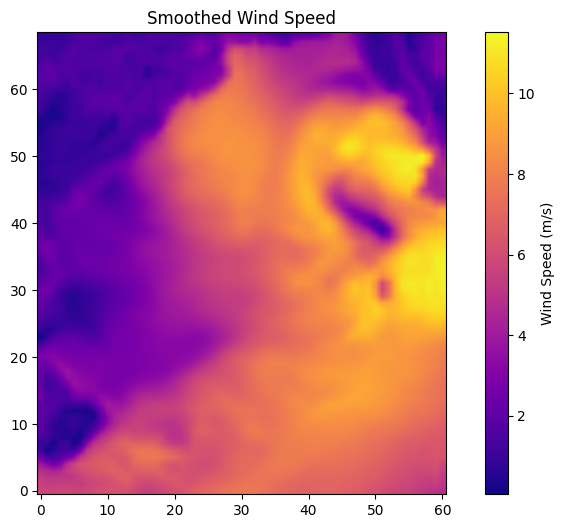

In [31]:
plt.figure(figsize=(10, 6))
plt.imshow(
    ds_combined['wind_speed'].isel(valid_time=time_index).values,
    cmap='plasma',
    origin='lower',
    interpolation='bilinear'
)
plt.colorbar(label='Wind Speed (m/s)')
plt.title('Smoothed Wind Speed')
plt.show()

imshow() is not that good

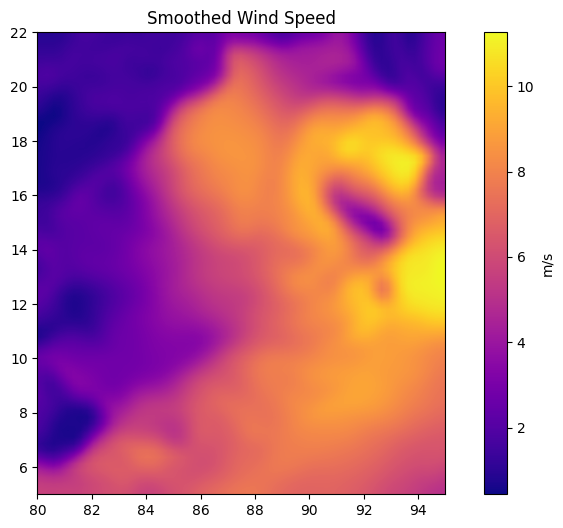

In [32]:
from scipy.ndimage import gaussian_filter

wind_slice = ds_combined['wind_speed'].isel(valid_time=time_index)
wind_smoothed = gaussian_filter(wind_slice.values, sigma=1)

# Plot with imshow (interpolation works here)
plt.figure(figsize=(10, 6))
plt.imshow(
    wind_smoothed,
    origin='lower',
    cmap='plasma',
    extent=[
        float(wind_slice.longitude.min()), float(wind_slice.longitude.max()),
        float(wind_slice.latitude.min()), float(wind_slice.latitude.max())
    ],
    interpolation='bilinear'  # Works here!
)
plt.title('Smoothed Wind Speed')
plt.colorbar(label='m/s')
plt.show()

gpt said Gaussian gives the best result, but i got better result in contour.

In [33]:
!apt-get install -y libproj-dev proj-data proj-bin libgeos-dev
!pip install Cartopy


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
libgeos-dev is already the newest version (3.12.1-1~jammy0).
libgeos-dev set to manually installed.
libproj-dev is already the newest version (9.3.1-1~jammy0).
libproj-dev set to manually installed.
proj-data is already the newest version (9.3.1-1~jammy0).
proj-data set to manually installed.
The following NEW packages will be installed:
  proj-bin
0 upgraded, 1 newly installed, 0 to remove and 35 not upgraded.
Need to get 205 kB of archives.
After this operation, 521 kB of additional disk space will be used.
Get:1 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy/main amd64 proj-bin amd64 9.3.1-1~jammy0 [205 kB]
Fetched 205 kB in 1s (205 kB/s)
Selecting previously unselected package proj-bin.
(Reading database ... 126109 files and directories currently installed.)
Preparing to unpack .../proj-bin_9.3.1-1~jammy0_amd64.deb ...
Unpacking proj-bin (9.3.1-1~jammy0) ...
Setting up proj

Cartopy - map function

In [34]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature

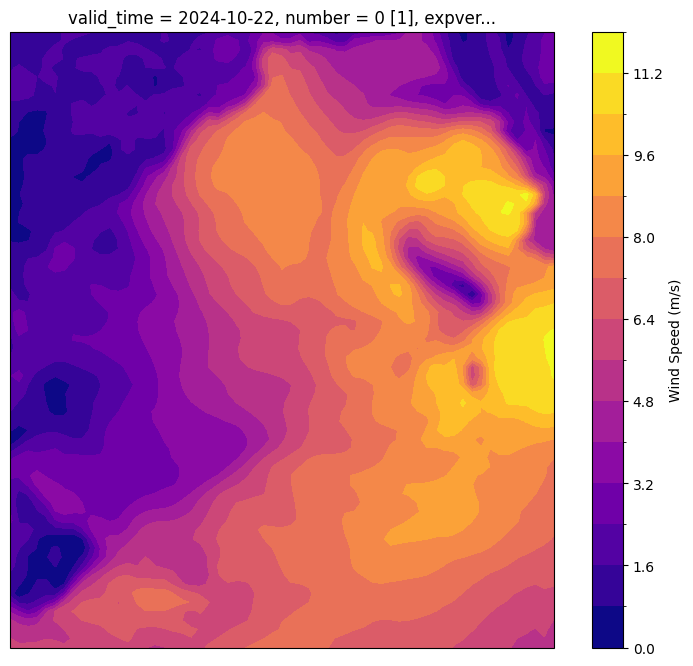

In [38]:

# Select a time slice
data = ds_combined['wind_speed'].isel(valid_time=time_index)

# Create plot
plt.figure(figsize=(10, 8))
ax = plt.axes(projection=ccrs.PlateCarree())  # Set projection

# Plot data as contourf
data.plot.contourf(
    ax=ax,
    transform=ccrs.PlateCarree(),  # Match projection
    cmap='plasma',
    levels=20,
    cbar_kwargs={'label': 'Wind Speed (m/s)'}
)


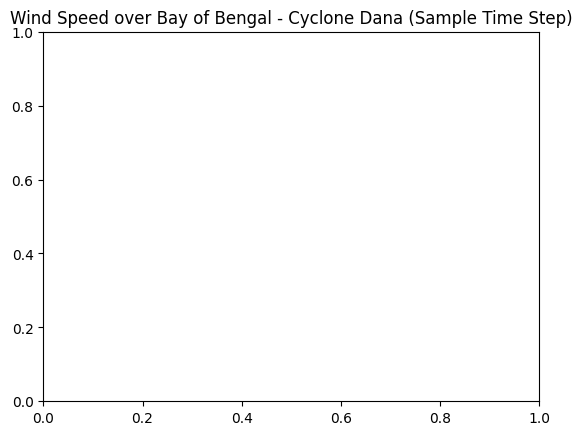

In [39]:
# Add geographical features
ax.coastlines(resolution='10m')
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(cfeature.LAND, facecolor='lightgray')
ax.add_feature(cfeature.OCEAN, facecolor='lightblue')
ax.set_extent([80, 100, 5, 30])  # Focus on Bay of Bengal region

# Add title
plt.title('Wind Speed over Bay of Bengal - Cyclone Dana (Sample Time Step)')
plt.show()

didn't come

/usr/local/lib/python3.11/dist-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/50m_physical/ne_50m_land.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)
/usr/local/lib/python3.11/dist-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/50m_physical/ne_50m_ocean.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)
/usr/local/lib/python3.11/dist-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/10m_physical/ne_10m_coastline.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)
/usr/local/lib/python3.11/dist-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/50m_cultural/ne_50m_admin_0_boundary_lines_land.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)


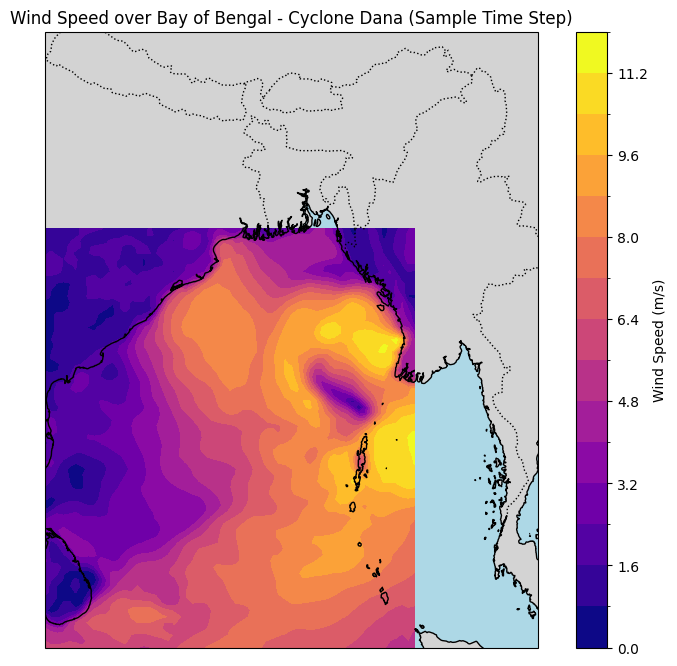

In [40]:
# Select a time slice
data = ds_combined['wind_speed'].isel(valid_time=time_index)

# Create plot
plt.figure(figsize=(10, 8))
ax = plt.axes(projection=ccrs.PlateCarree())  # Set projection

# Plot data as contourf
data.plot.contourf(
    ax=ax,
    transform=ccrs.PlateCarree(),  # Match projection
    cmap='plasma',
    levels=20,
    cbar_kwargs={'label': 'Wind Speed (m/s)'}
)

# Add geographical features
ax.coastlines(resolution='10m')
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(cfeature.LAND, facecolor='lightgray')
ax.add_feature(cfeature.OCEAN, facecolor='lightblue')
ax.set_extent([80, 100, 5, 30])  # Focus on Bay of Bengal region

# Add title
plt.title('Wind Speed over Bay of Bengal - Cyclone Dana (Sample Time Step)')
plt.show()

/usr/local/lib/python3.11/dist-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/10m_physical/ne_10m_land.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)
/usr/local/lib/python3.11/dist-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/10m_physical/ne_10m_ocean.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)
/usr/local/lib/python3.11/dist-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/10m_cultural/ne_10m_admin_0_boundary_lines_land.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)


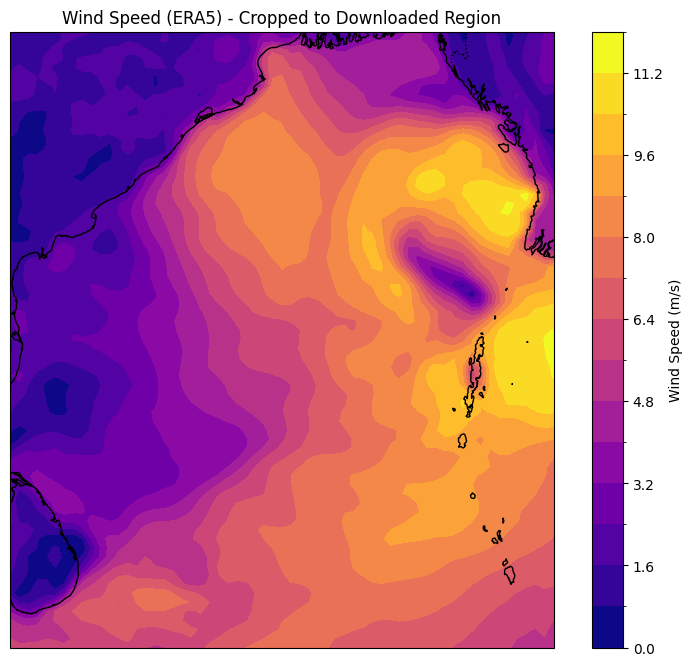

In [41]:
# Extract data
data = ds_combined['wind_speed'].isel(valid_time=time_index)

# Get latitude and longitude bounds from your dataset
lat_min = float(data.latitude.min())
lat_max = float(data.latitude.max())
lon_min = float(data.longitude.min())
lon_max = float(data.longitude.max())

# Plot
plt.figure(figsize=(10, 8))
ax = plt.axes(projection=ccrs.PlateCarree())

# Plot wind speed
data.plot.contourf(
    ax=ax,
    transform=ccrs.PlateCarree(),
    cmap='plasma',
    levels=20,
    cbar_kwargs={'label': 'Wind Speed (m/s)'}
)

# Add map features
ax.coastlines(resolution='10m')
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(cfeature.LAND, facecolor='lightgray')
ax.add_feature(cfeature.OCEAN, facecolor='lightblue')

# Zoom to your data’s extent
ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())

# Title
plt.title('Wind Speed (ERA5) - Cropped to Downloaded Region')
plt.show()

I love this mappp!! >.<

In [43]:
def plot_variable(var_name, title, units, time_index=0, cmap='viridis'):
    data = ds_combined[var_name].isel(valid_time=time_index)

    lat_min = float(data.latitude.min())
    lat_max = float(data.latitude.max())
    lon_min = float(data.longitude.min())
    lon_max = float(data.longitude.max())

    plt.figure(figsize=(10, 8))
    ax = plt.axes(projection=ccrs.PlateCarree())

    # Plotting
    data.plot.contourf(
        ax=ax,
        transform=ccrs.PlateCarree(),
        cmap=cmap,
        levels=20,
        cbar_kwargs={'label': f'{title} ({units})'}
    )

    # Map features
    ax.coastlines(resolution='10m')
    ax.add_feature(cfeature.BORDERS, linestyle=':')
    ax.add_feature(cfeature.LAND, facecolor='lightgray')
    ax.add_feature(cfeature.OCEAN, facecolor='lightblue')
    ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())

    plt.title(f'{title} - Time Step {time_index}')
    plt.show()


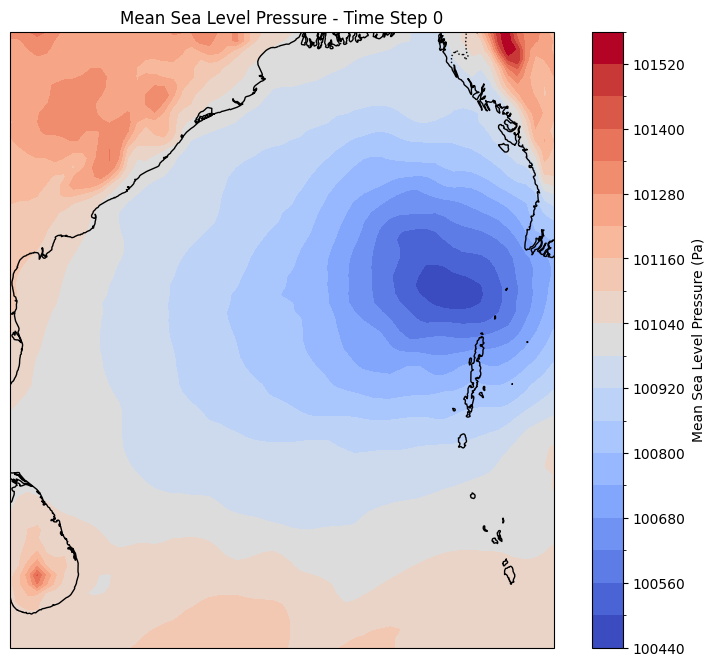

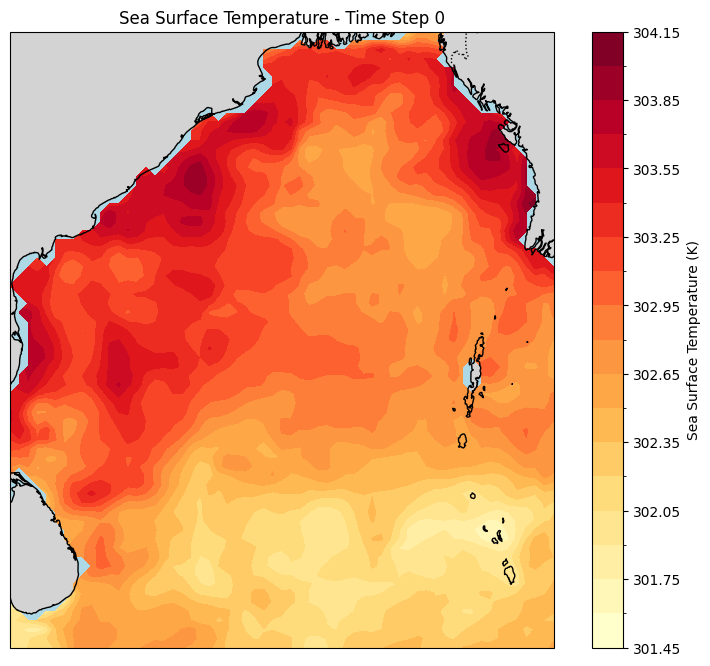

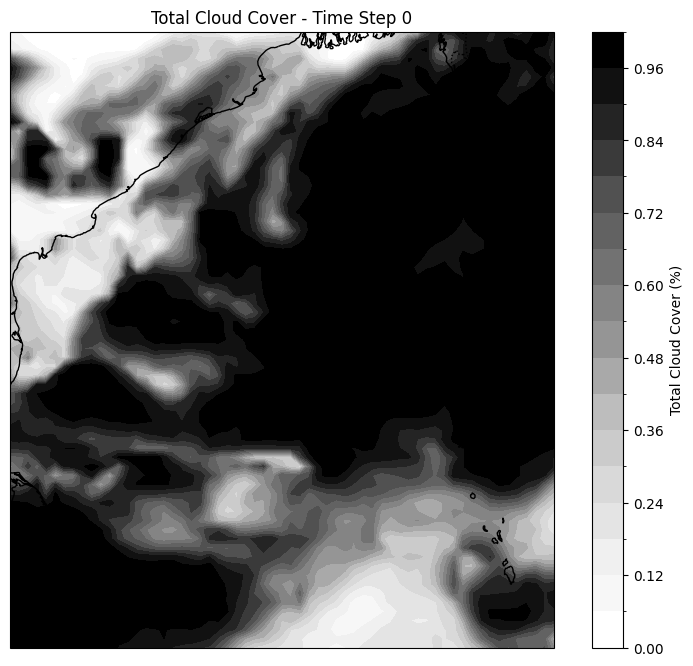

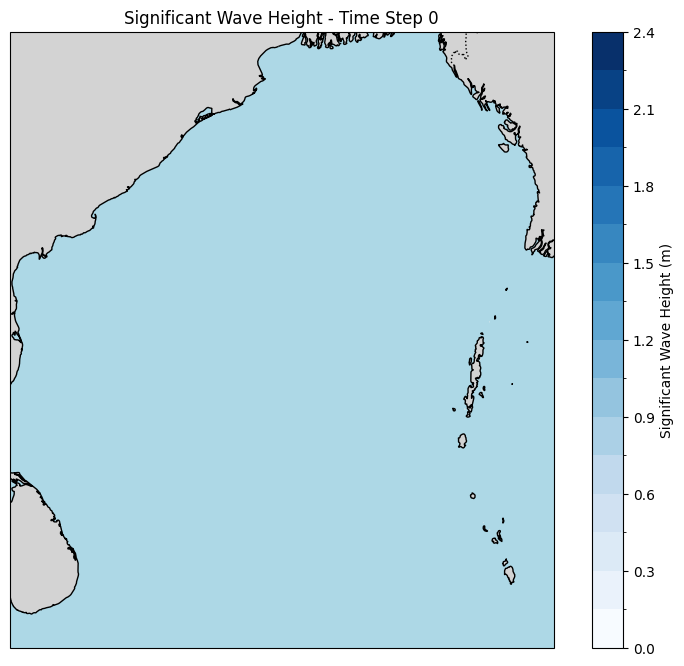

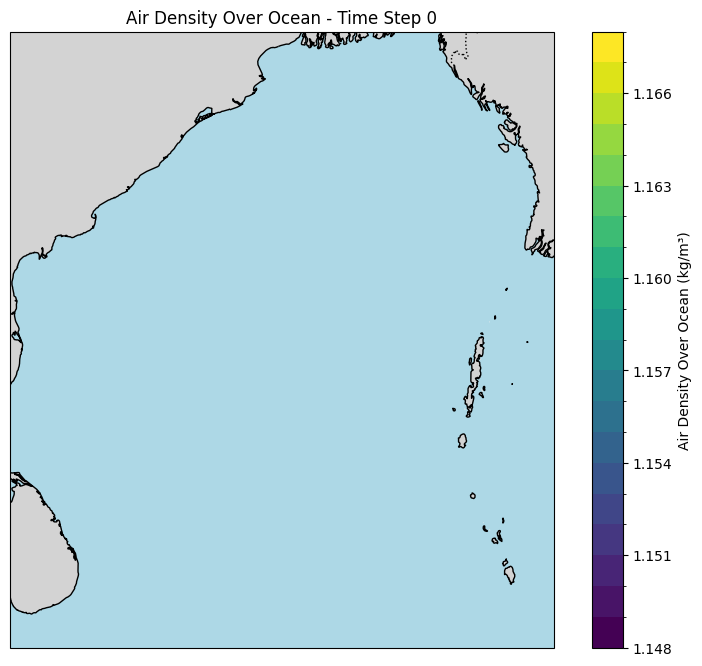

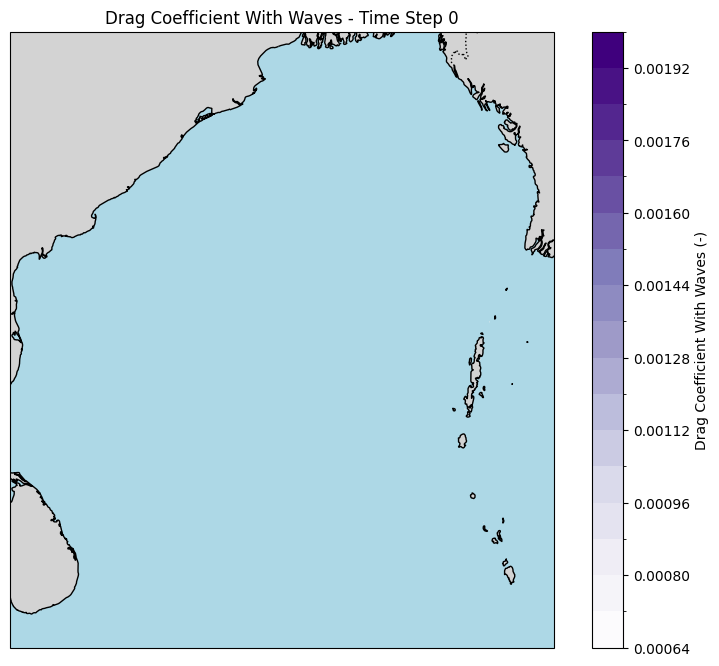

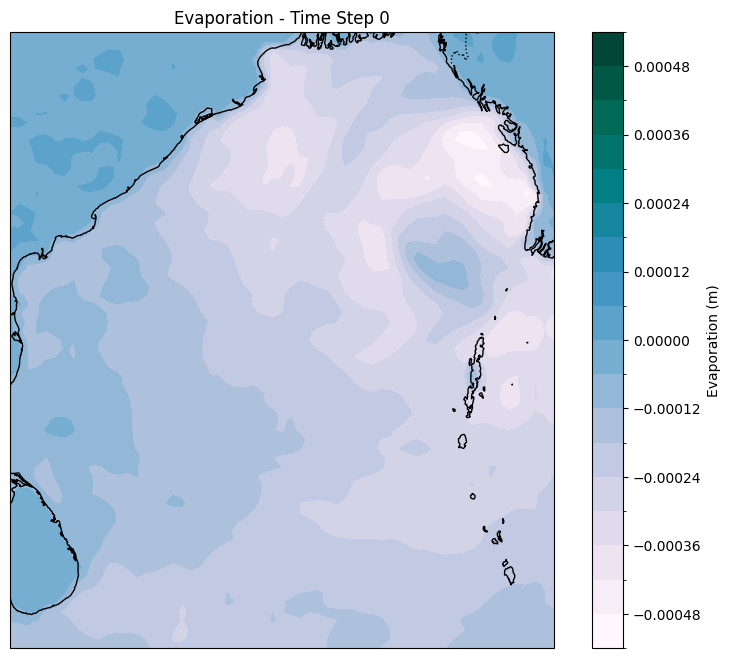

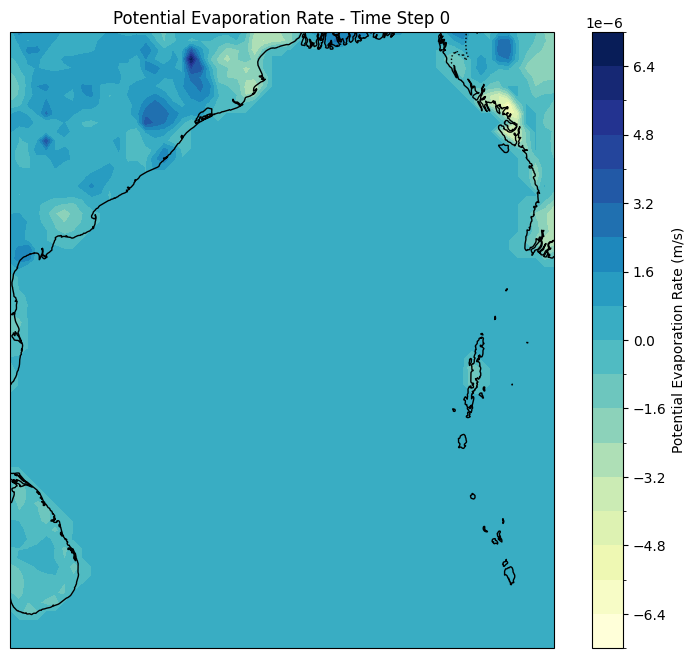

In [44]:
plot_variable('msl', 'Mean Sea Level Pressure', 'Pa', cmap='coolwarm')
plot_variable('sst', 'Sea Surface Temperature', 'K', cmap='YlOrRd')
plot_variable('tcc', 'Total Cloud Cover', '%', cmap='Greys')
plot_variable('swh', 'Significant Wave Height', 'm', cmap='Blues')
plot_variable('rhoao', 'Air Density Over Ocean', 'kg/m³')
plot_variable('cdww', 'Drag Coefficient With Waves', '-', cmap='Purples')
plot_variable('e', 'Evaporation', 'm', cmap='PuBuGn')
plot_variable('avg_pevr', 'Potential Evaporation Rate', 'm/s', cmap='YlGnBu')

In [45]:
def plot_over_time(var_name, title, units, time_dim='valid_time', cmap='viridis'):
    # Determine the time steps
    time_values = ds_combined[var_name][time_dim].values

    for i, time_val in enumerate(time_values):
        data = ds_combined[var_name].isel({time_dim: i})

        lat_min = float(data.latitude.min())
        lat_max = float(data.latitude.max())
        lon_min = float(data.longitude.min())
        lon_max = float(data.longitude.max())

        plt.figure(figsize=(10, 8))
        ax = plt.axes(projection=ccrs.PlateCarree())

        # Plot variable
        data.plot.contourf(
            ax=ax,
            transform=ccrs.PlateCarree(),
            cmap=cmap,
            levels=20,
            cbar_kwargs={'label': f'{title} ({units})'}
        )

        # Add map features
        ax.coastlines(resolution='10m')
        ax.add_feature(cfeature.BORDERS, linestyle=':')
        ax.add_feature(cfeature.LAND, facecolor='lightgray')
        ax.add_feature(cfeature.OCEAN, facecolor='lightblue')
        ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())

        # Format time label
        if hasattr(time_val, 'astype'):  # For cftime.datetime or numpy.datetime64
            readable_time = str(time_val.astype('M8[m]'))
        else:
            readable_time = str(time_val)

        plt.title(f'{title} - {readable_time}')
        plt.tight_layout()
        plt.show()

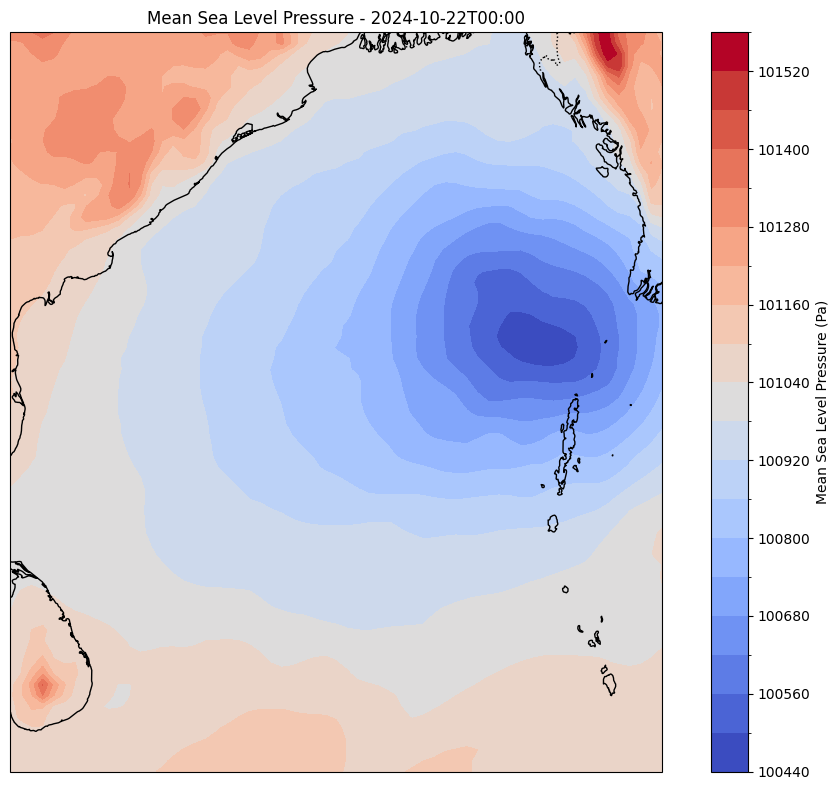

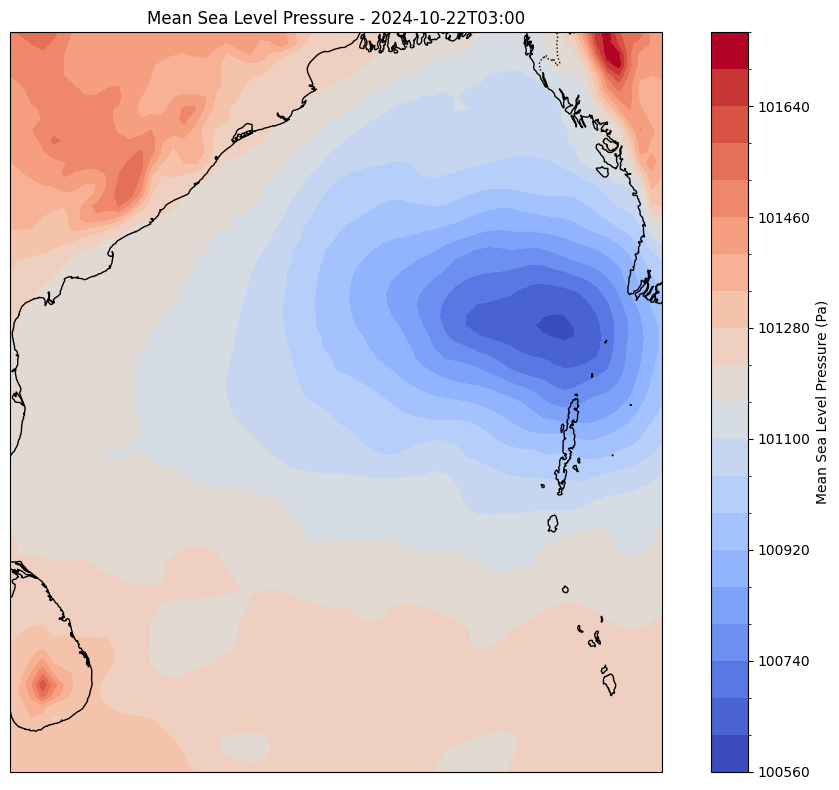

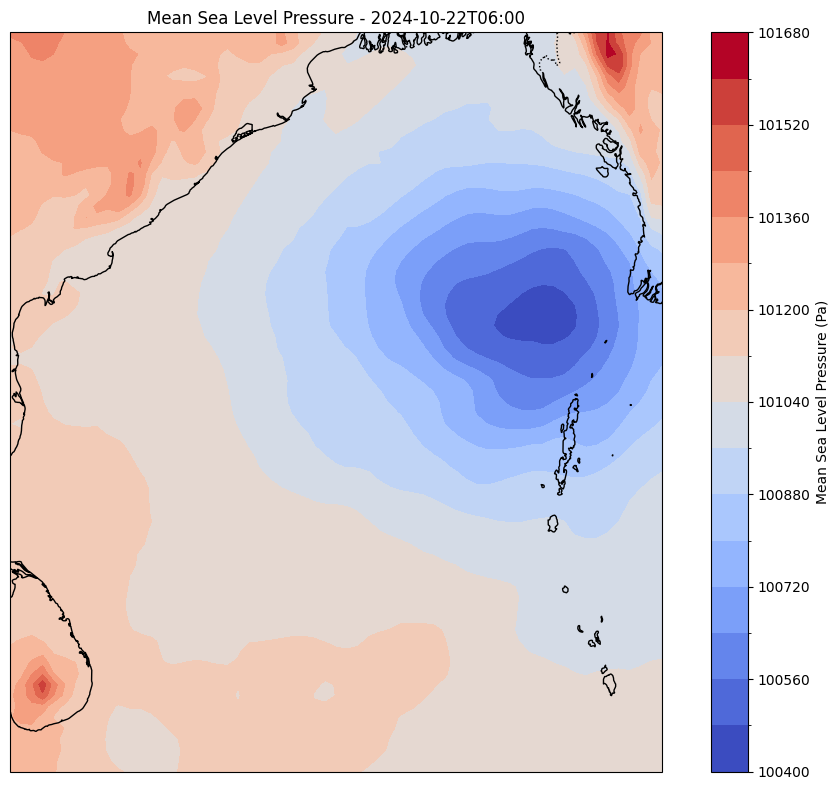

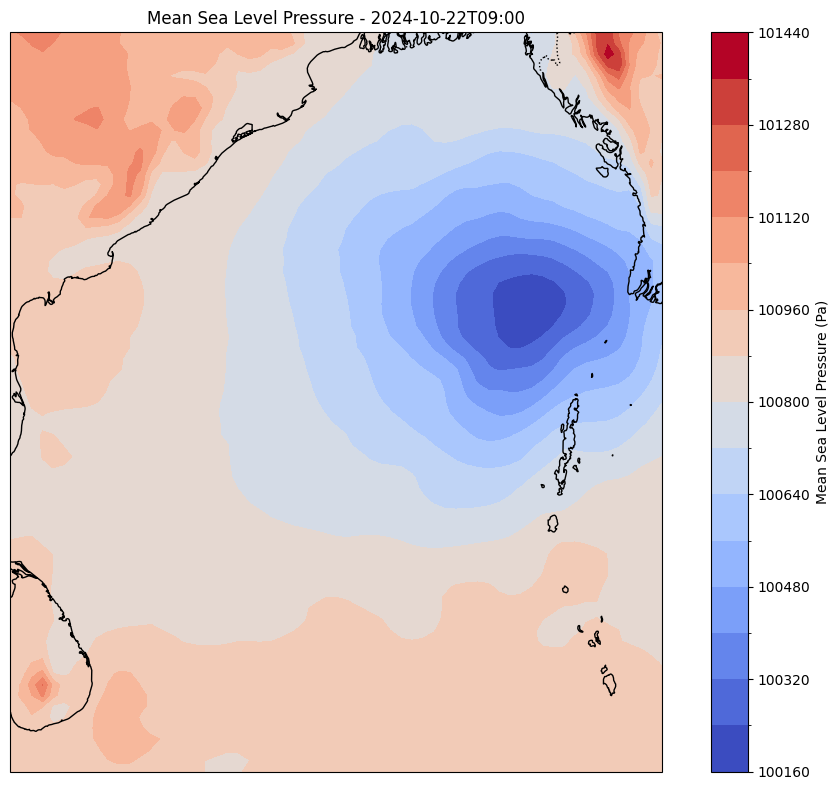

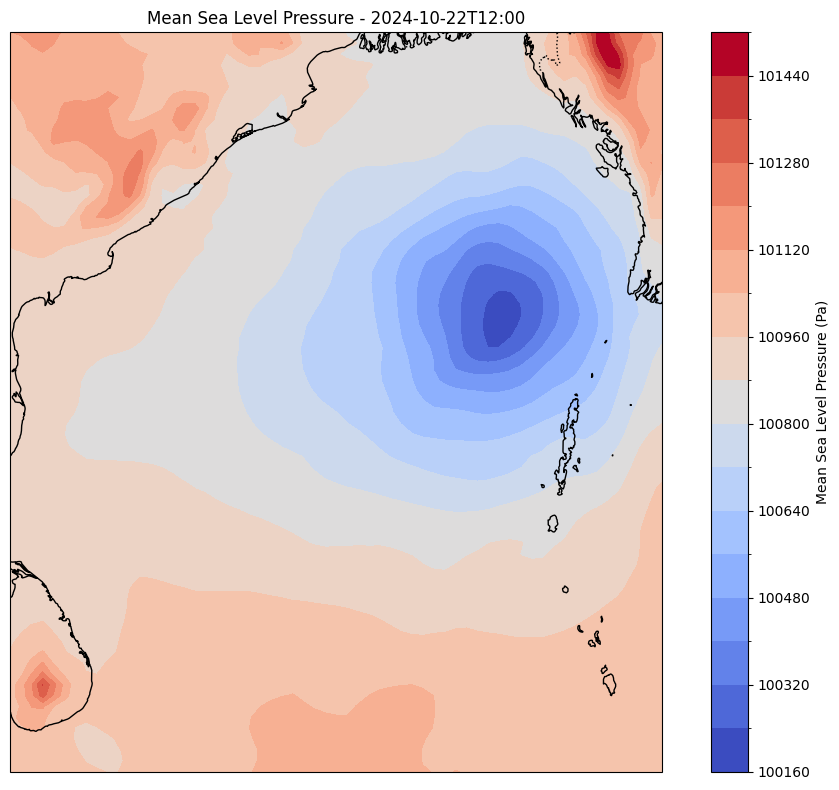

...

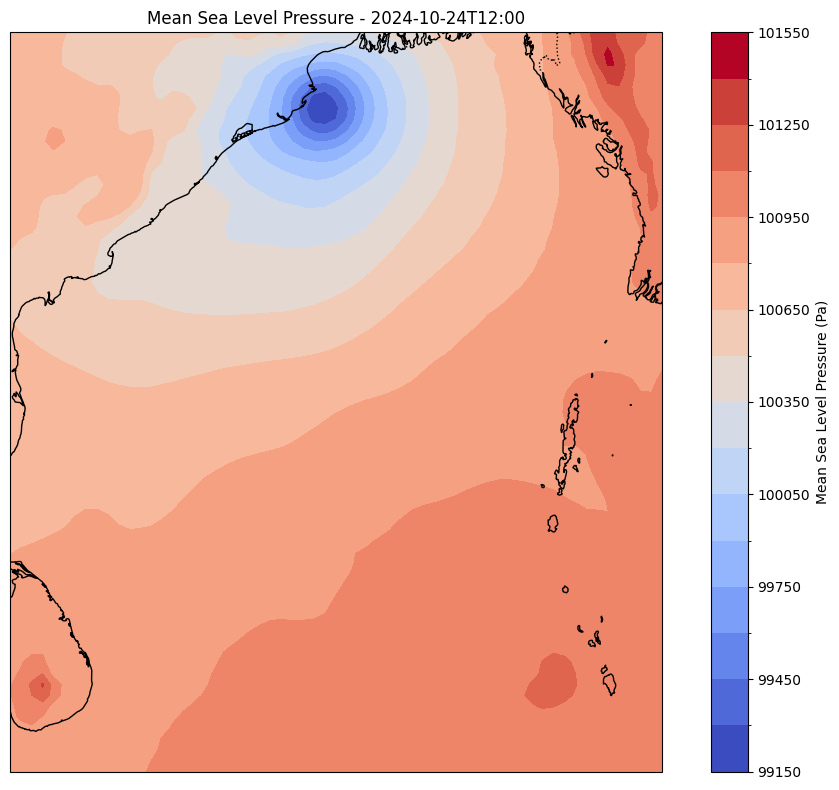

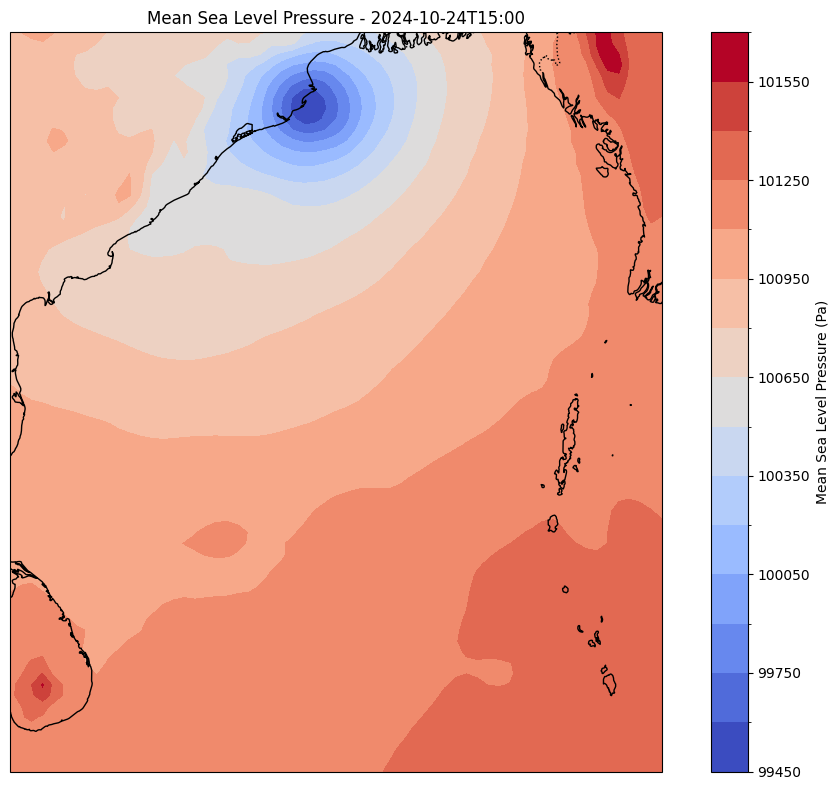

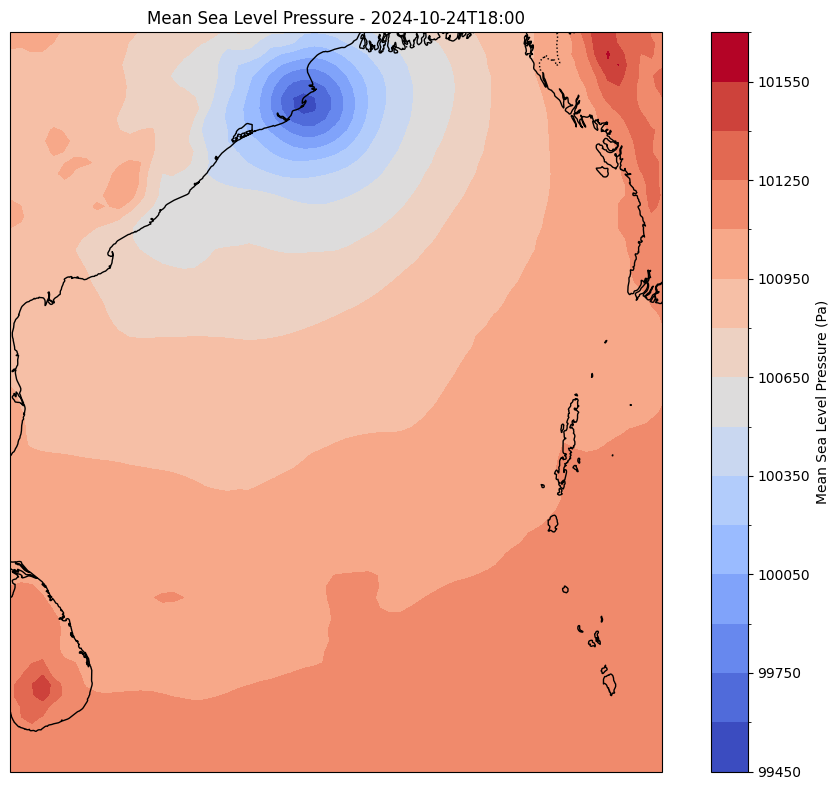

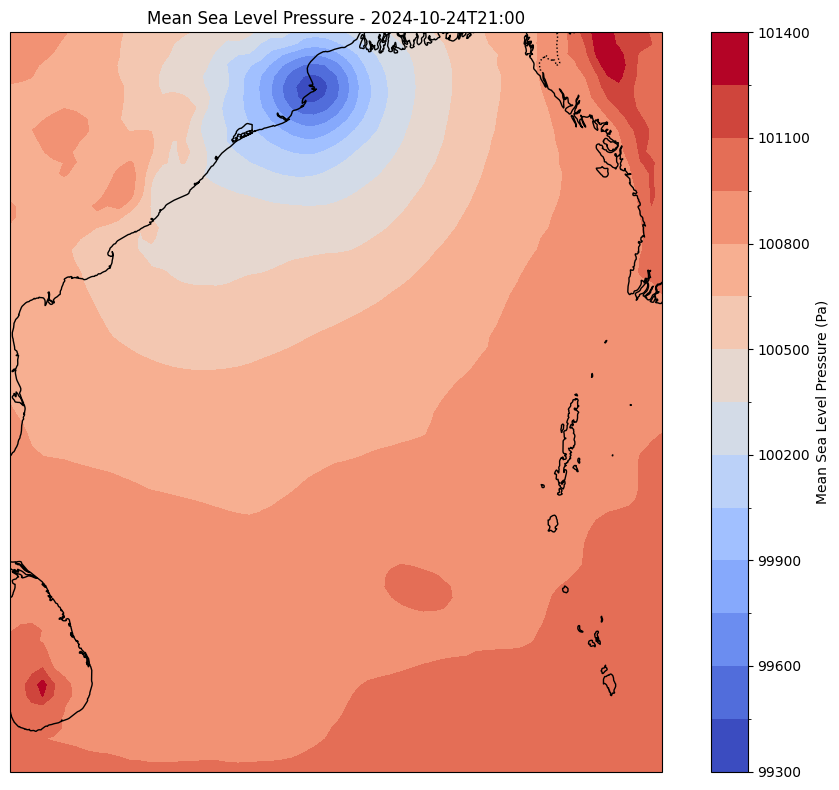

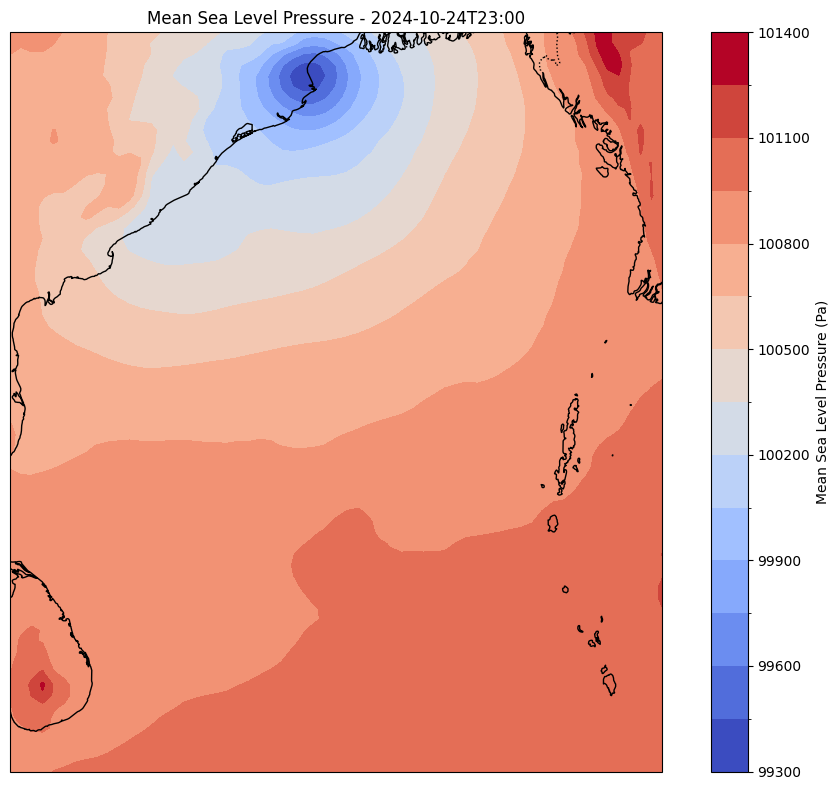

In [46]:
plot_over_time('msl', 'Mean Sea Level Pressure', 'Pa', time_dim='valid_time', cmap='coolwarm')

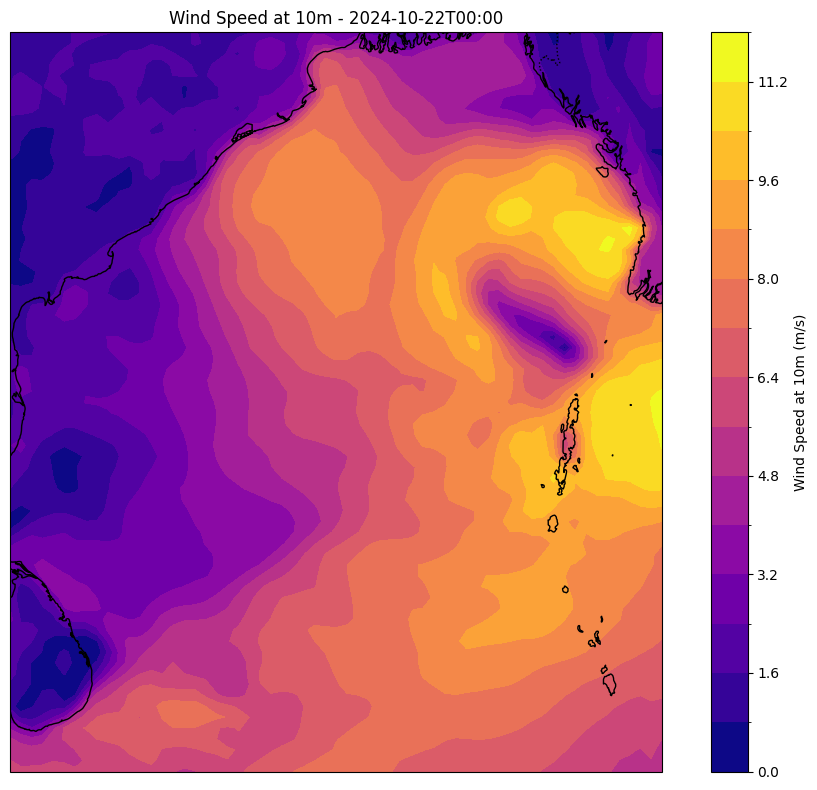

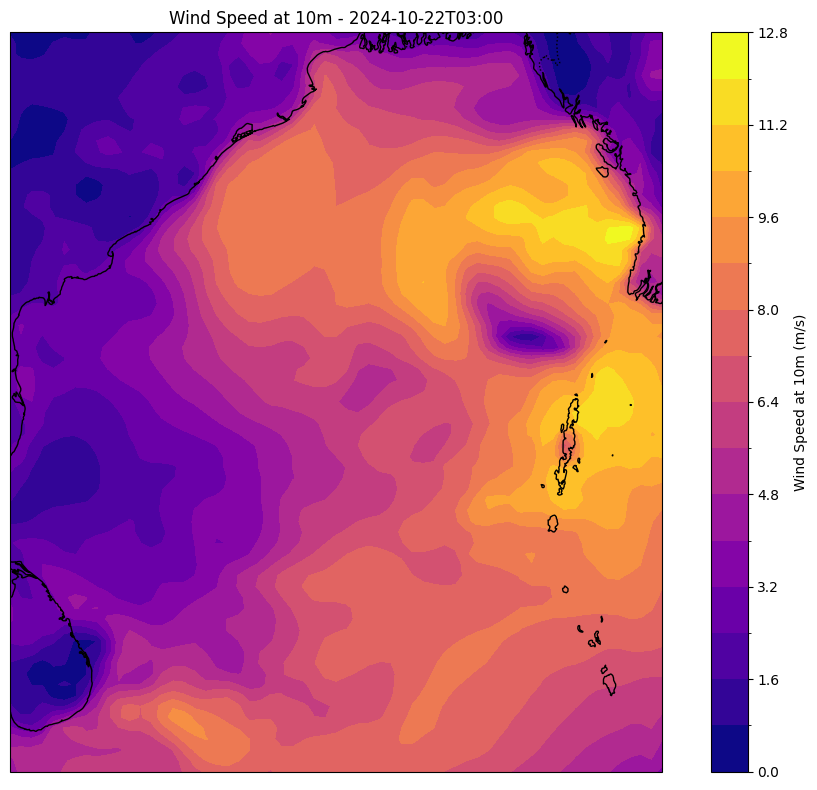

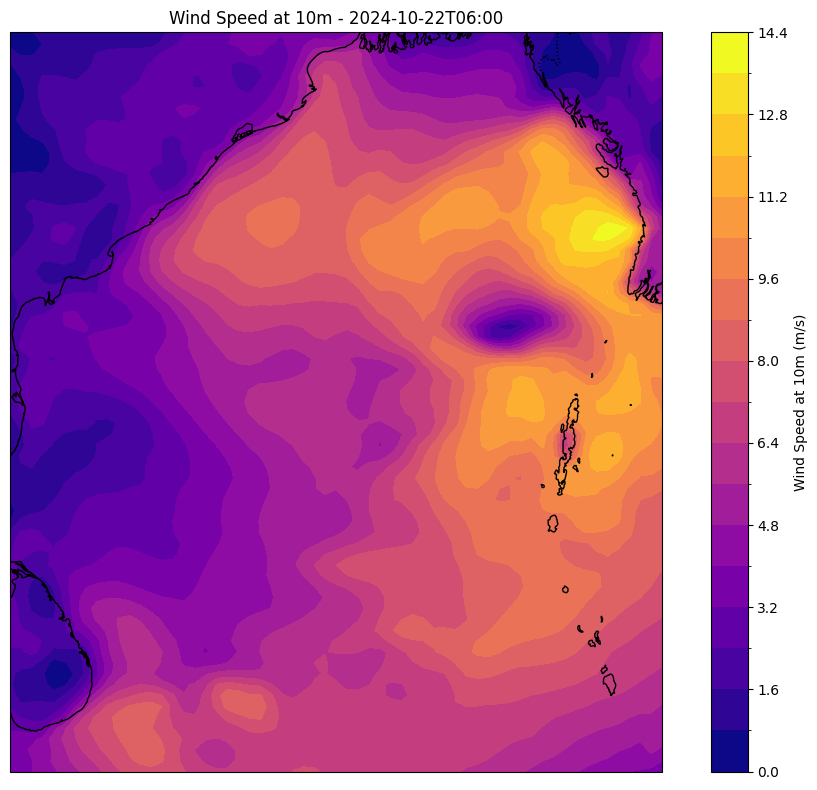

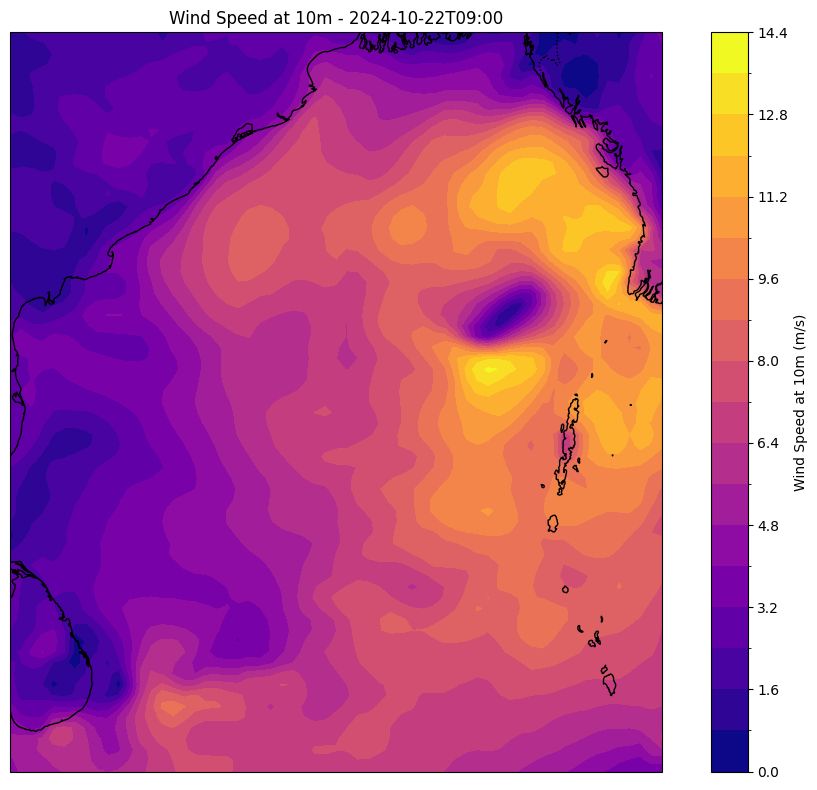

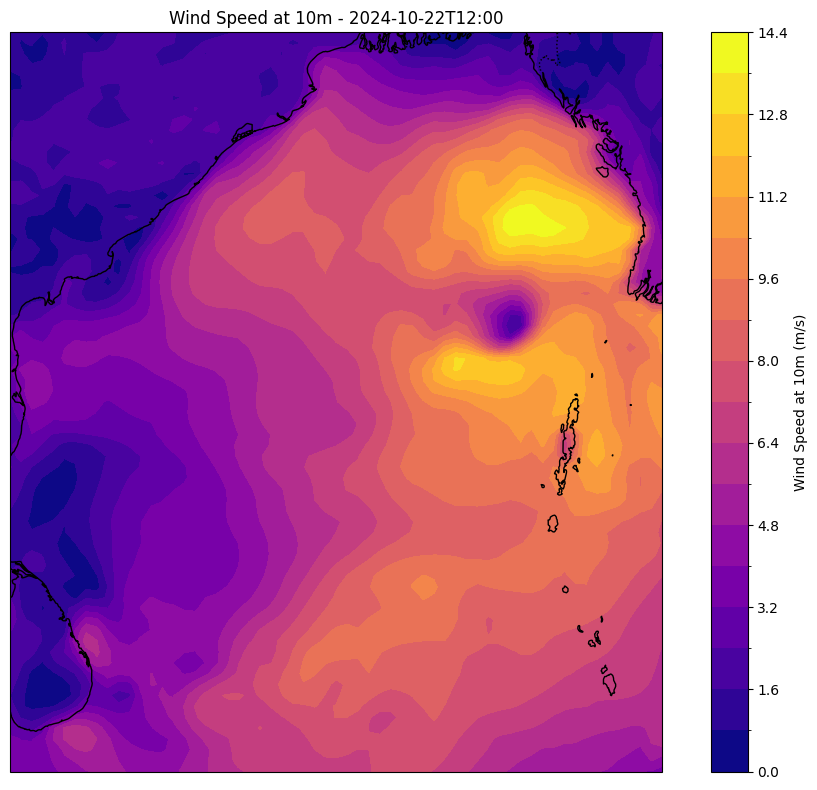

...

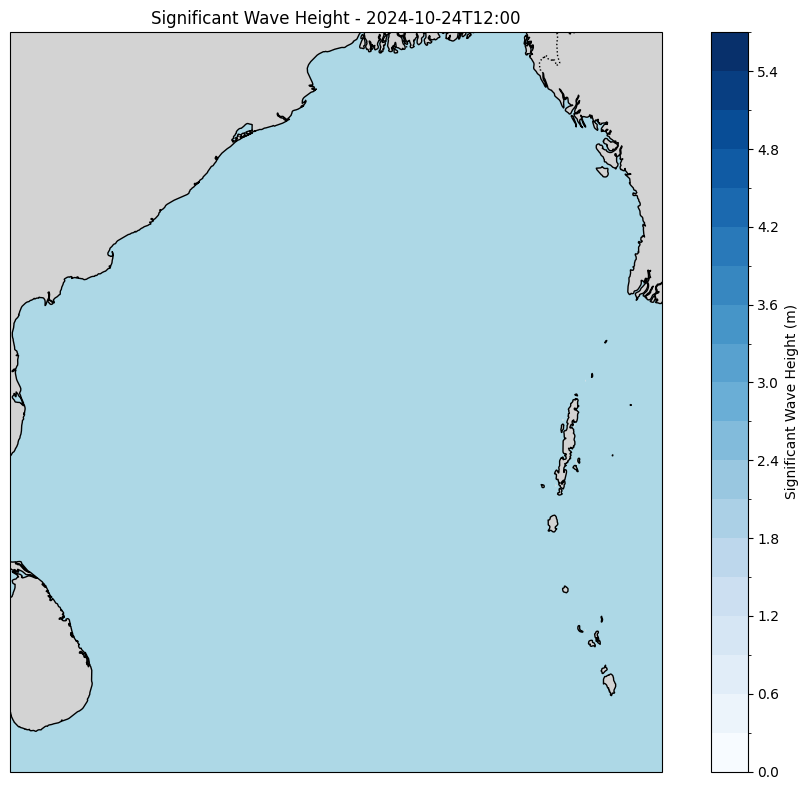

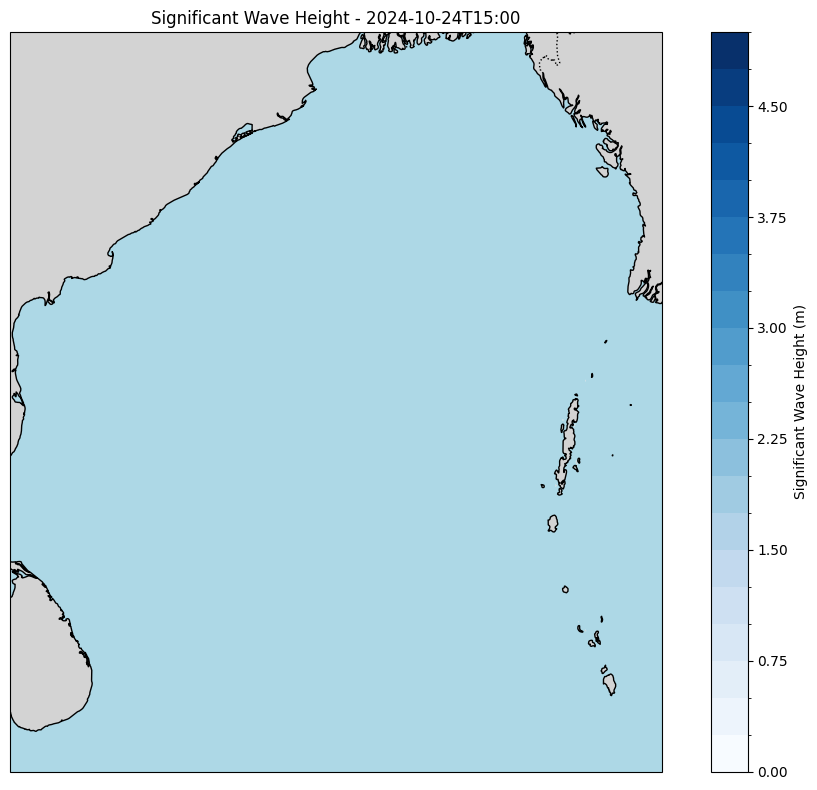

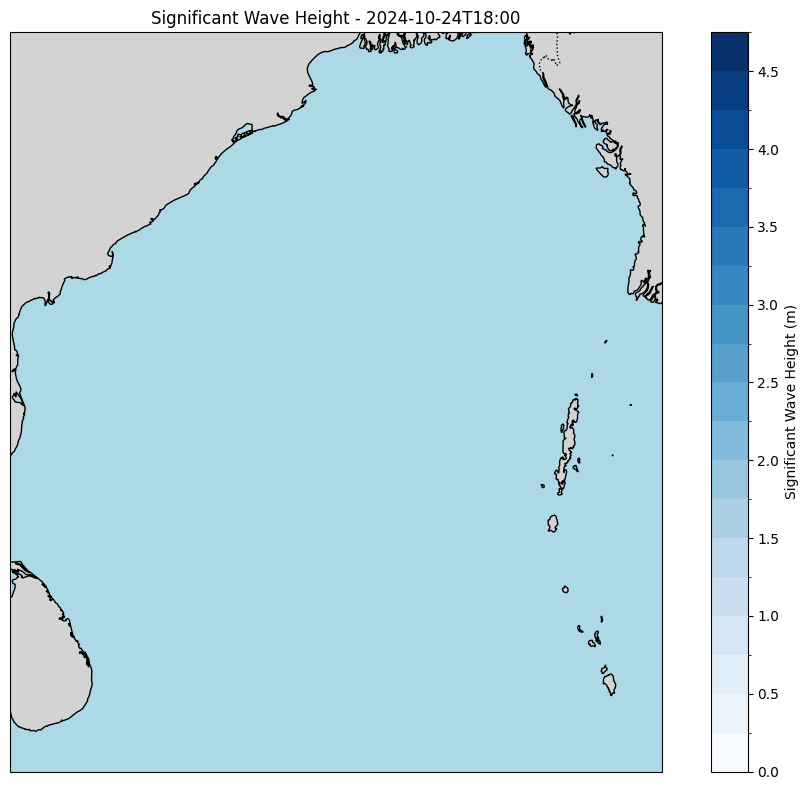

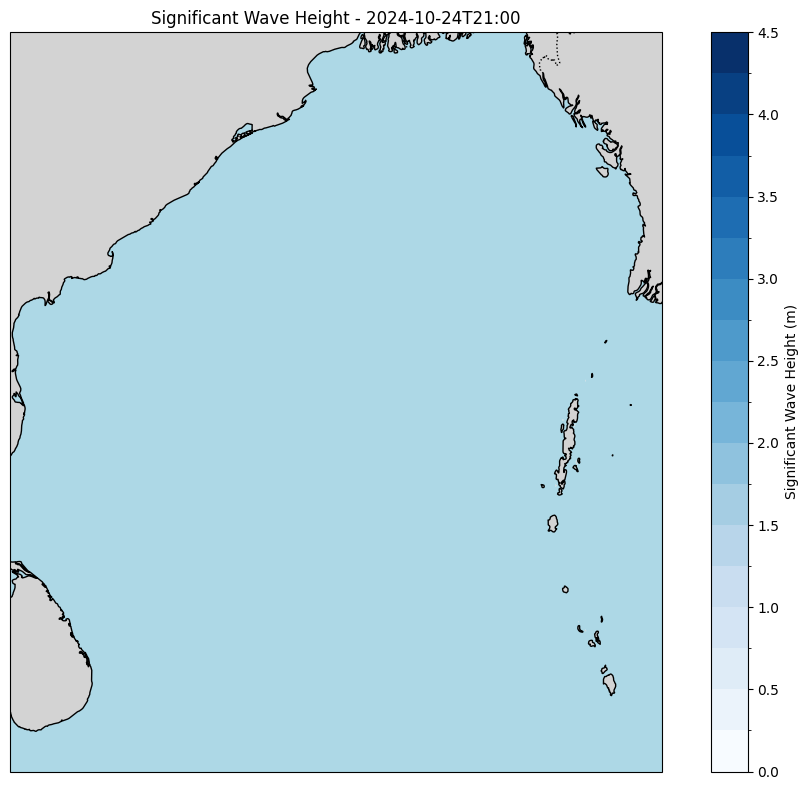

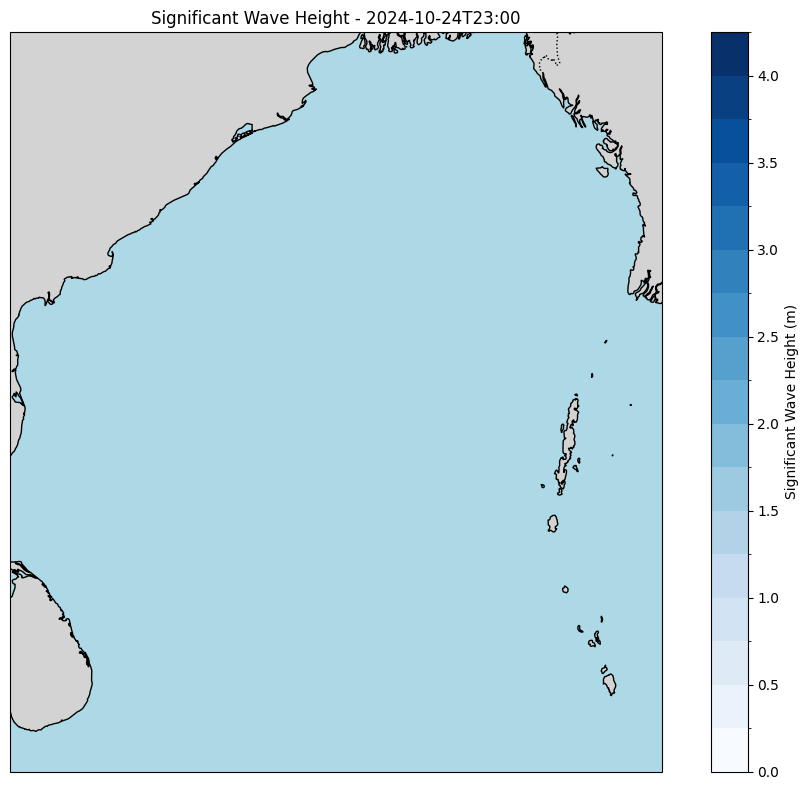

KeyError: 'time'

In [48]:
plot_over_time('wind_speed', 'Wind Speed at 10m', 'm/s', time_dim='valid_time', cmap='plasma')
plot_over_time('sst', 'Sea Surface Temperature', 'K', time_dim='valid_time', cmap='YlOrRd')
plot_over_time('tcc', 'Total Cloud Cover', '%', time_dim='valid_time', cmap='Greys')
plot_over_time('swh', 'Significant Wave Height', 'm', time_dim='valid_time', cmap='Blues')
plot_over_time('e', 'Evaporation', 'm', time_dim='time', cmap='PuBuGn')  # From accum file

In [49]:
import cartopy.feature as cfeature

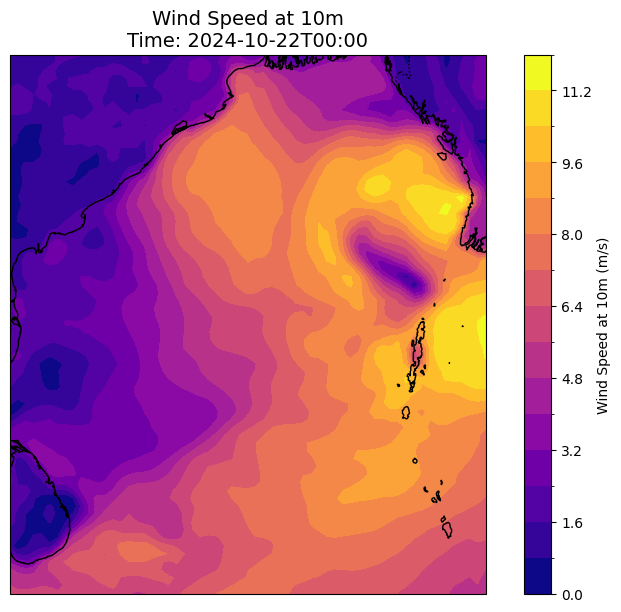

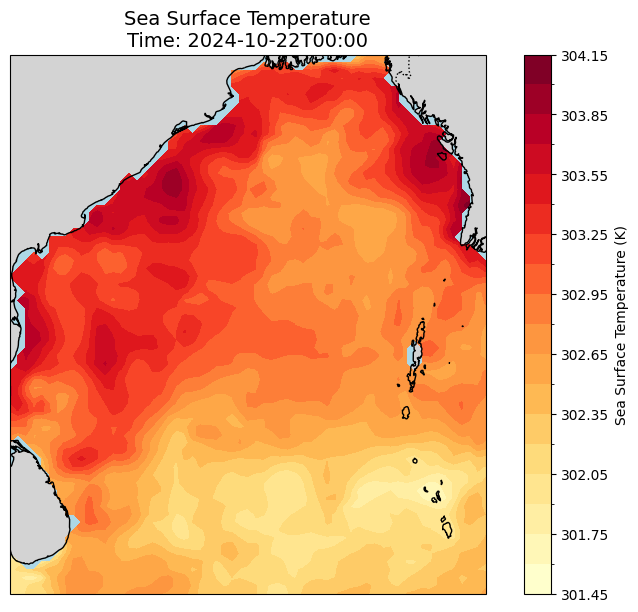

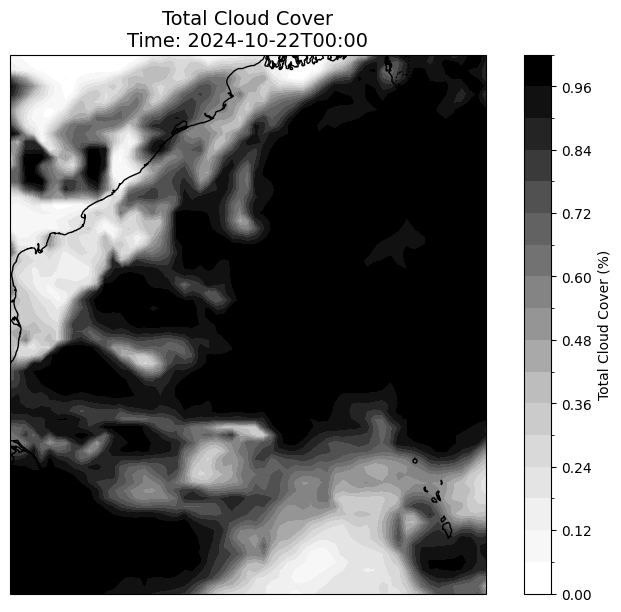

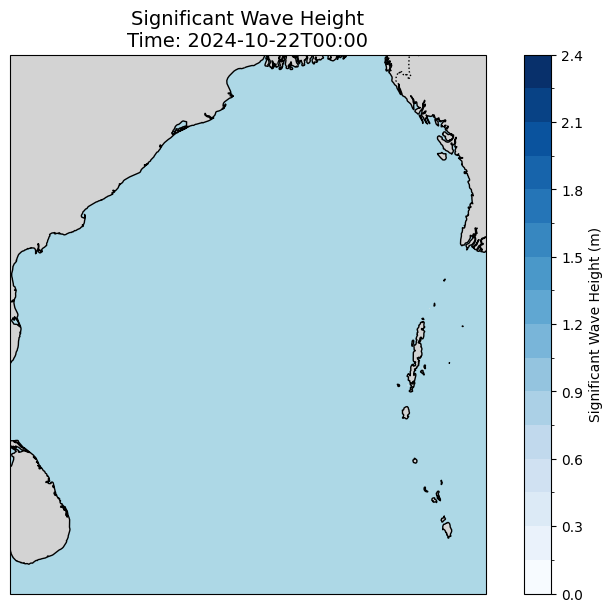

❌ Skipping e: 'time' dimension not found.


In [50]:
def plot_variable_over_time(var_name, title, units, time_dim, cmap='plasma', interval=36):
    data = ds_combined[var_name]

    # Check if time dimension exists
    if time_dim not in data.dims:
        print(f"❌ Skipping {var_name}: '{time_dim}' dimension not found.")
        return

    times = data[time_dim]

    # Sample every 36 time steps (e.g., every 36 hours)
    sampled_indices = range(0, len(times), interval)

    lat_min = float(data.latitude.min())
    lat_max = float(data.latitude.max())
    lon_min = float(data.longitude.min())
    lon_max = float(data.longitude.max())

    for idx in sampled_indices:
        plt.figure(figsize=(10, 7))
        ax = plt.axes(projection=ccrs.PlateCarree())
        ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())
        ax.coastlines(resolution='10m')
        ax.add_feature(cfeature.BORDERS, linestyle=':')
        ax.add_feature(cfeature.LAND, facecolor='lightgray')
        ax.add_feature(cfeature.OCEAN, facecolor='lightblue')

        # Select data for the current time index
        frame_data = data.isel({time_dim: idx})
        time_val = times[idx].values
        readable_time = str(np.datetime64(time_val, 'm'))

        # Plot filled contours
        contour = frame_data.plot.contourf(
            ax=ax,
            transform=ccrs.PlateCarree(),
            cmap=cmap,
            levels=20,
            add_colorbar=True,
            cbar_kwargs={'label': f'{title} ({units})'}
        )

        ax.set_title(f'{title}\nTime: {readable_time}', fontsize=14)
        plt.show()

# Use this function for your variables:
plot_variable_over_time('wind_speed', 'Wind Speed at 10m', 'm/s', time_dim='valid_time', cmap='plasma')
plot_variable_over_time('sst', 'Sea Surface Temperature', 'K', time_dim='valid_time', cmap='YlOrRd')
plot_variable_over_time('tcc', 'Total Cloud Cover', '%', time_dim='valid_time', cmap='Greys')
plot_variable_over_time('swh', 'Significant Wave Height', 'm', time_dim='valid_time', cmap='Blues')
plot_variable_over_time('e', 'Evaporation', 'm', time_dim='time', cmap='PuBuGn')

In [54]:
from IPython.display import HTML

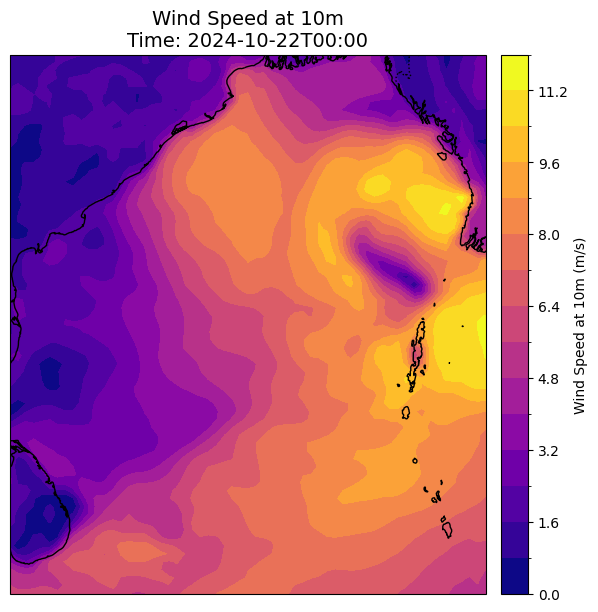

AttributeError: 'ArtistList' object has no attribute 'clear'

In [55]:
anim = animate_variable('wind_speed', 'Wind Speed at 10m', 'm/s', time_dim='valid_time', cmap='plasma', interval=36)

HTML(anim.to_jshtml())

In [56]:
ax.collections.clear()

AttributeError: 'ArtistList' object has no attribute 'clear'

In [52]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
from matplotlib.animation import FuncAnimation

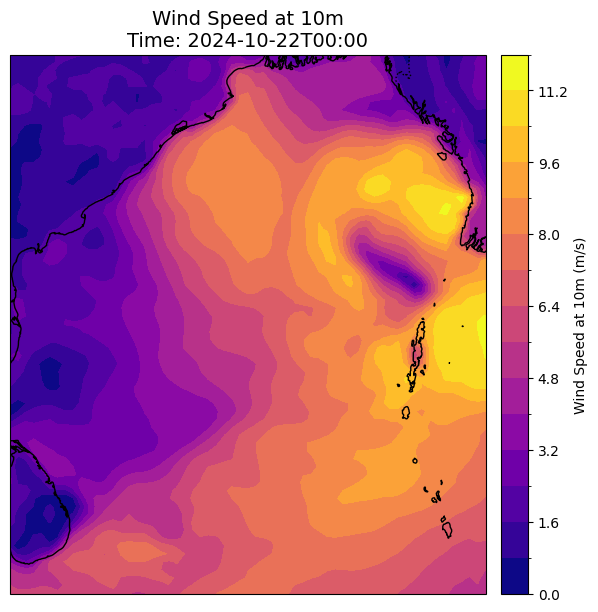

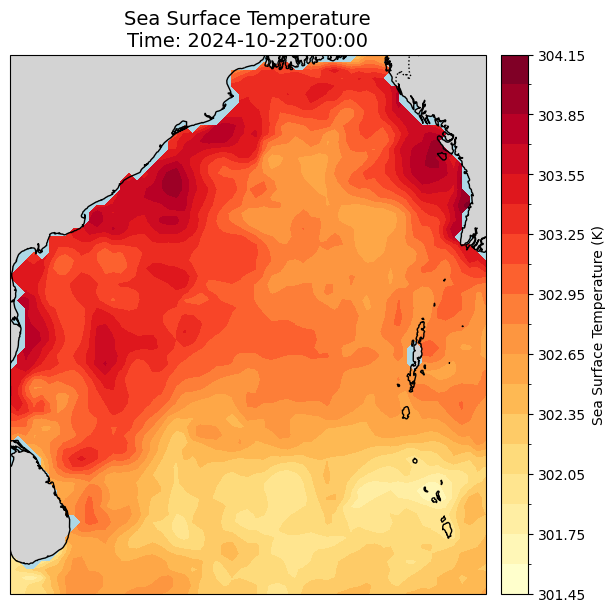

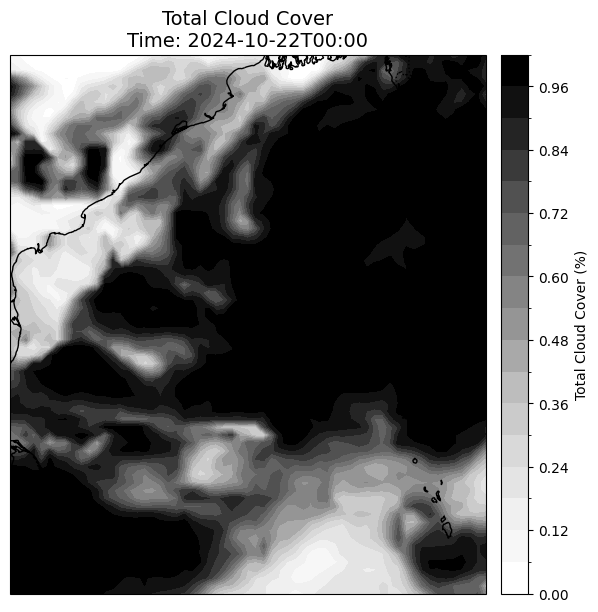

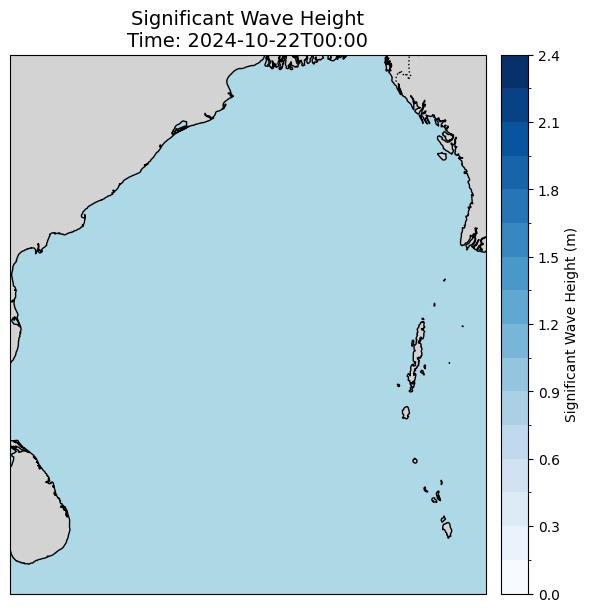

❌ Skipping e: 'time' dimension not found.


In [53]:
def animate_variable(var_name, title, units, time_dim, cmap='plasma', interval=1):
    data = ds_combined[var_name]

    if time_dim not in data.dims:
        print(f"❌ Skipping {var_name}: '{time_dim}' dimension not found.")
        return

    times = data[time_dim]

    lat_min = float(data.latitude.min())
    lat_max = float(data.latitude.max())
    lon_min = float(data.longitude.min())
    lon_max = float(data.longitude.max())

    fig, ax = plt.subplots(figsize=(10,7), subplot_kw={'projection': ccrs.PlateCarree()})
    ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())
    ax.coastlines(resolution='10m')
    ax.add_feature(cfeature.BORDERS, linestyle=':')
    ax.add_feature(cfeature.LAND, facecolor='lightgray')
    ax.add_feature(cfeature.OCEAN, facecolor='lightblue')

    # Initial plot (empty)
    frame_data = data.isel({time_dim: 0})
    contourf = frame_data.plot.contourf(
        ax=ax,
        transform=ccrs.PlateCarree(),
        cmap=cmap,
        levels=20,
        add_colorbar=False  # We'll add colorbar separately
    )
    cbar = plt.colorbar(contourf, ax=ax, orientation='vertical', pad=0.02)
    cbar.set_label(f'{title} ({units})')

    time_text = ax.set_title(f'{title}\nTime: {str(np.datetime64(times[0].values, "m"))}', fontsize=14)

    def update(frame):
        ax.collections.clear()  # Clear previous contours
        frame_data = data.isel({time_dim: frame})
        cont = frame_data.plot.contourf(
            ax=ax,
            transform=ccrs.PlateCarree(),
            cmap=cmap,
            levels=20,
            add_colorbar=False
        )
        time_text.set_text(f'{title}\nTime: {str(np.datetime64(times[frame].values, "m"))}')
        return cont.collections + [time_text]

    # Animate with specified interval steps (default 1)
    frames = range(0, len(times), interval)
    anim = FuncAnimation(fig, update, frames=frames, blit=False, repeat=False)

    plt.show()
    return anim

# Example usage with 36-step interval (to reduce number of frames):
anim1 = animate_variable('wind_speed', 'Wind Speed at 10m', 'm/s', time_dim='valid_time', cmap='plasma', interval=36)
anim2 = animate_variable('sst', 'Sea Surface Temperature', 'K', time_dim='valid_time', cmap='YlOrRd', interval=36)
anim3 = animate_variable('tcc', 'Total Cloud Cover', '%', time_dim='valid_time', cmap='Greys', interval=36)
anim4 = animate_variable('swh', 'Significant Wave Height', 'm', time_dim='valid_time', cmap='Blues', interval=36)
anim5 = animate_variable('e', 'Evaporation', 'm', time_dim='time', cmap='PuBuGn', interval=36)

In [58]:
def update(frame):
    # Remove previous contour plots
    for coll in ax.collections:
        coll.remove()

    frame_data = data.isel({time_dim: frame})
    cont = frame_data.plot.contourf(
        ax=ax,
        transform=ccrs.PlateCarree(),
        cmap=cmap,
        levels=20,
        add_colorbar=False
    )
    time_text.set_text(f'{title}\nTime: {str(np.datetime64(times[frame].values, "m"))}')
    return cont.collections + [time_text]

AttributeError: 'GeoContourSet' object has no attribute 'collections'

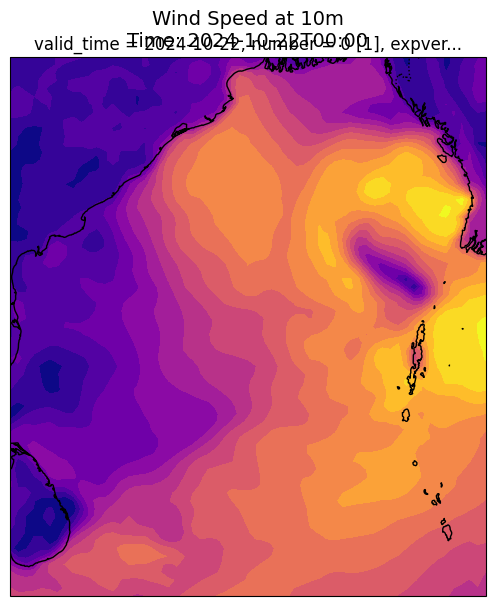

In [59]:
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

def animate_variable(var_name, title, units, time_dim, cmap='plasma', interval=1, save_path=None):
    data = ds_combined[var_name]

    if time_dim not in data.dims:
        print(f"❌ Skipping {var_name}: '{time_dim}' dimension not found.")
        return None

    times = data[time_dim]

    # Limit frames based on interval
    frame_indices = list(range(0, len(times), interval))

    lat_min = float(data.latitude.min())
    lat_max = float(data.latitude.max())
    lon_min = float(data.longitude.min())
    lon_max = float(data.longitude.max())

    fig, ax = plt.subplots(figsize=(10, 7), subplot_kw={'projection': ccrs.PlateCarree()})
    ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())
    ax.coastlines(resolution='10m')
    ax.add_feature(cfeature.BORDERS, linestyle=':')
    ax.add_feature(cfeature.LAND, facecolor='lightgray')
    ax.add_feature(cfeature.OCEAN, facecolor='lightblue')

    # Initial plot (empty)
    cont = None
    time_text = ax.text(0.5, 1.02, '', transform=ax.transAxes, ha='center', fontsize=14)

    def update(frame):
        nonlocal cont
        # Remove previous contour collections
        if cont:
            for c in cont.collections:
                c.remove()

        frame_data = data.isel({time_dim: frame_indices[frame]})
        cont = frame_data.plot.contourf(
            ax=ax,
            transform=ccrs.PlateCarree(),
            cmap=cmap,
            levels=20,
            add_colorbar=False
        )
        readable_time = str(np.datetime64(times[frame_indices[frame]].values, 'm'))
        time_text.set_text(f'{title}\nTime: {readable_time}')
        return cont.collections + [time_text]

    anim = FuncAnimation(fig, update, frames=len(frame_indices), blit=True, repeat=False)

    if save_path:
        anim.save(save_path, writer='ffmpeg', fps=2)

    plt.close(fig)  # Prevent static plot display in notebook output
    return anim

# Now, create animations for your variables
anim_wind = animate_variable('wind_speed', 'Wind Speed at 10m', 'm/s', time_dim='valid_time', cmap='plasma', interval=36, save_path='wind_speed.mp4')
anim_sst = animate_variable('sst', 'Sea Surface Temperature', 'K', time_dim='valid_time', cmap='YlOrRd', interval=36, save_path='sst.mp4')
anim_tcc = animate_variable('tcc', 'Total Cloud Cover', '%', time_dim='valid_time', cmap='Greys', interval=36, save_path='tcc.mp4')
anim_swh = animate_variable('swh', 'Significant Wave Height', 'm', time_dim='valid_time', cmap='Blues', interval=36, save_path='swh.mp4')
anim_evap = animate_variable('e', 'Evaporation', 'm', time_dim='time', cmap='PuBuGn', interval=36, save_path='evaporation.mp4')

# To display animations inline in a Jupyter/Colab notebook:
# Uncomment below lines one by one to see animation outputs

# HTML(anim_wind.to_jshtml())
# HTML(anim_sst.to_jshtml())
# HTML(anim_tcc.to_jshtml())
# HTML(anim_swh.to_jshtml())
# HTML(anim_evap.to_jshtml())


In [61]:
def animate_variable(var_name, title, units, time_dim, cmap='plasma', interval=1, save_path=None):
    data = ds_combined[var_name]

    if time_dim not in data.dims:
        print(f"❌ Skipping {var_name}: '{time_dim}' dimension not found.")
        return None

    times = data[time_dim]

    frame_indices = list(range(0, len(times), interval))

    lat_min = float(data.latitude.min())
    lat_max = float(data.latitude.max())
    lon_min = float(data.longitude.min())
    lon_max = float(data.longitude.max())

    fig, ax = plt.subplots(figsize=(10, 7), subplot_kw={'projection': ccrs.PlateCarree()})
    ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())
    ax.coastlines(resolution='10m')
    ax.add_feature(cfeature.BORDERS, linestyle=':')
    ax.add_feature(cfeature.LAND, facecolor='lightgray')
    ax.add_feature(cfeature.OCEAN, facecolor='lightblue')

    cont = None
    time_text = ax.text(0.5, 1.02, '', transform=ax.transAxes, ha='center', fontsize=14)

    def update(frame):
        nonlocal cont
        if cont:
            for c in cont._contour.collections:
                c.remove()

        frame_data = data.isel({time_dim: frame_indices[frame]})
        cont = frame_data.plot.contourf(
            ax=ax,
            transform=ccrs.PlateCarree(),
            cmap=cmap,
            levels=20,
            add_colorbar=False
        )
        readable_time = str(np.datetime64(times[frame_indices[frame]].values, 'm'))
        time_text.set_text(f'{title}\nTime: {readable_time}')
        return cont._contour.collections + [time_text]

    anim = FuncAnimation(fig, update, frames=len(frame_indices), blit=True, repeat=False)

    if save_path:
        anim.save(save_path, writer='ffmpeg', fps=2)

    plt.close(fig)
    return anim


In [62]:
!apt-get install -y ffmpeg

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
ffmpeg is already the newest version (7:4.4.2-0ubuntu0.22.04.1).
0 upgraded, 0 newly installed, 0 to remove and 35 not upgraded.


AttributeError: 'GeoContourSet' object has no attribute '_contour'

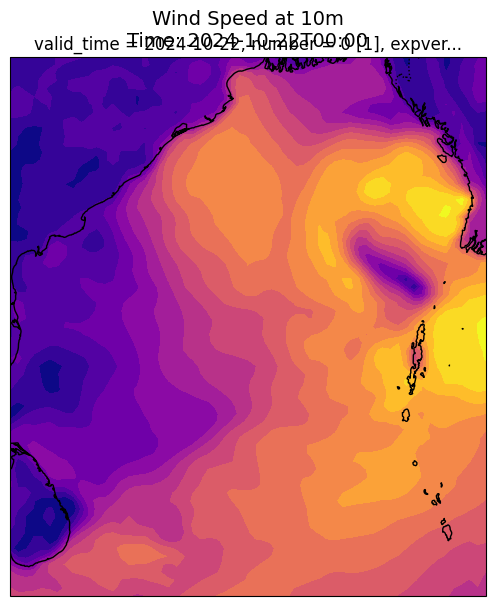

In [63]:
from IPython.display import HTML

anim = animate_variable('wind_speed', 'Wind Speed at 10m', 'm/s', time_dim='valid_time', cmap='plasma', interval=36)
HTML(anim.to_jshtml())

The error happens because cont is a QuadContourSet (or GeoContourSet), which does not have a _contour attribute. Instead, the collections of contours are directly in cont.collections.



In [64]:
def update(frame):
    for coll in cont.collections:
        coll.remove()  # Remove previous contour collections

    frame_data = data.isel({time_dim: frame_indices[frame]})
    cont = frame_data.plot.contourf(
        ax=ax,
        transform=ccrs.PlateCarree(),
        cmap=cmap,
        levels=20,
        add_colorbar=False
    )
    readable_time = str(np.datetime64(times[frame_indices[frame]].values, 'm'))
    time_text.set_text(f'{title}\nTime: {readable_time}')
    return cont.collections + [time_text]

In [68]:
from matplotlib.animation import FuncAnimation

anim = FuncAnimation(fig, update, frames=len(frame_indices), blit=True, repeat=False)


NameError: name 'frame_indices' is not defined

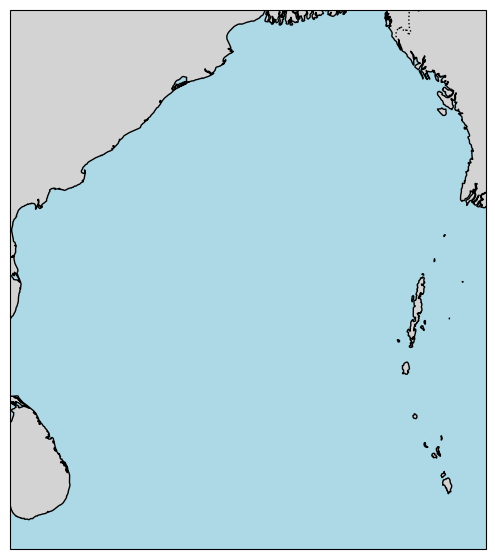

In [66]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs

fig, ax = plt.subplots(figsize=(10, 7), subplot_kw={'projection': ccrs.PlateCarree()})

# Set the map extent and add features (optional but recommended)
lat_min = float(data.latitude.min())
lat_max = float(data.latitude.max())
lon_min = float(data.longitude.min())
lon_max = float(data.longitude.max())
ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())
ax.coastlines(resolution='10m')
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(cfeature.LAND, facecolor='lightgray')
ax.add_feature(cfeature.OCEAN, facecolor='lightblue')

In [67]:
anim = FuncAnimation(fig, update, frames=len(frame_indices), blit=True, repeat=False)


NameError: name 'frame_indices' is not defined

In [70]:
def update(frame):
    for coll in ax.collections:
        coll.remove()  # Remove previous contours

    frame_data = data.isel({time_dim: frame_indices[frame]})
    cont = frame_data.plot.contourf(
        ax=ax,
        transform=ccrs.PlateCarree(),
        cmap='plasma',
        levels=20,
        add_colorbar=False
    )
    readable_time = str(np.datetime64(data[time_dim][frame_indices[frame]].values, 'm'))
    time_text.set_text(f'Wind Speed at 10m\nTime: {readable_time}')
    return ax.collections + [time_text]


In [72]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

def animate_variable(var_name, title, units, time_dim='valid_time', cmap='plasma', interval=36, save_path=None):
    data = ds_combined[var_name]

    if time_dim not in data.dims:
        print(f"❌ Skipping {var_name}: '{time_dim}' dimension not found.")
        return None

    times = data[time_dim]
    frame_indices = list(range(0, len(times), interval))

    lat_min = float(data.latitude.min())
    lat_max = float(data.latitude.max())
    lon_min = float(data.longitude.min())
    lon_max = float(data.longitude.max())

    fig = plt.figure(figsize=(10, 7))
    ax = plt.axes(projection=ccrs.PlateCarree())
    ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())
    ax.coastlines(resolution='10m')
    ax.add_feature(cfeature.BORDERS, linestyle=':')
    ax.add_feature(cfeature.LAND, facecolor='lightgray')
    ax.add_feature(cfeature.OCEAN, facecolor='lightblue')

    time_text = ax.text(
        0.5, 1.02, '',
        transform=ax.transAxes, ha='center', fontsize=14
    )

    # Initialize first contour
    frame_data = data.isel({time_dim: frame_indices[0]})
    cont = frame_data.plot.contourf(
        ax=ax,
        transform=ccrs.PlateCarree(),
        cmap=cmap,
        levels=20,
        add_colorbar=True,
        cbar_kwargs={'label': f'{title} ({units})'}
    )

    def update(frame):
        # Remove previous contours
        for coll in ax.collections:
            coll.remove()

        frame_data = data.isel({time_dim: frame_indices[frame]})
        cont = frame_data.plot.contourf(
            ax=ax,
            transform=ccrs.PlateCarree(),
            cmap=cmap,
            levels=20,
            add_colorbar=False
        )

        readable_time = str(np.datetime64(times[frame_indices[frame]].values, 'm'))
        time_text.set_text(f'{title}\nTime: {readable_time}')

        return ax.collections + [time_text]

    anim = FuncAnimation(fig, update, frames=len(frame_indices), blit=True, repeat=False)

    if save_path:
        anim.save(save_path, writer='ffmpeg', fps=2)
        print(f"🎥 Saved animation to {save_path}")

    plt.close(fig)
    return anim

# Example: Create animation for wind speed every 36 hours and display inline on Colab/Jupyter
anim_wind = animate_variable('wind_speed', 'Wind Speed at 10m', 'm/s', time_dim='valid_time', cmap='plasma', interval=36)

# To display in notebook (Colab or Jupyter)
HTML(anim_wind.to_jshtml())


In [73]:
print("Total time steps:", len(ds_combined['wind_speed'][time_dim]))
print("Frames used in animation:", len(frame_indices))
print("Frame indices:", frame_indices)


Total time steps: 27
Frames used in animation: 1
Frame indices: [0]


In [74]:
!apt-get install -y ffmpeg


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
ffmpeg is already the newest version (7:4.4.2-0ubuntu0.22.04.1).
0 upgraded, 0 newly installed, 0 to remove and 35 not upgraded.


Total time steps: 27
Frames used in animation: 27
Frame indices: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26]


AttributeError: 'GeoContourSet' object has no attribute 'collections'

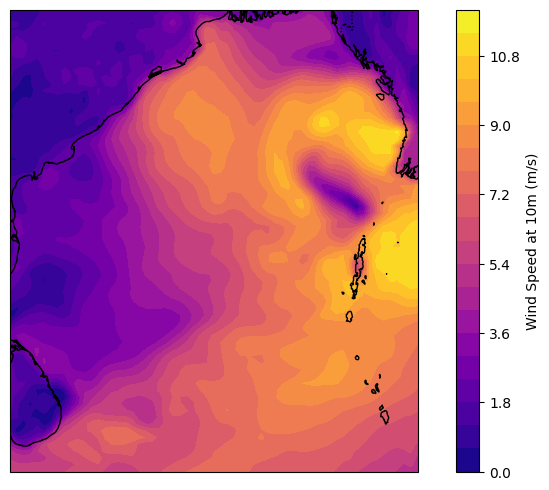

In [87]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

def animate_variable(var_name, title, units, time_dim='valid_time', cmap='plasma', interval=1):
    data = ds_combined[var_name]

    # Validate time dimension
    if time_dim not in data.dims:
        raise ValueError(f"{time_dim} not found in data dimensions.")

    times = data[time_dim].values
    total_steps = len(times)
    frame_indices = list(range(0, total_steps, interval))
    if frame_indices[-1] != total_steps - 1:
        frame_indices.append(total_steps - 1)

    print(f"Total time steps: {total_steps}")
    print(f"Frames used in animation: {len(frame_indices)}")
    print(f"Frame indices: {frame_indices}")

    # Prepare grid
    lats = data.latitude.values
    lons = data.longitude.values
    Lon, Lat = np.meshgrid(lons, lats)

    # Create figure and axis
    fig, ax = plt.subplots(figsize=(10, 6), subplot_kw={'projection': ccrs.PlateCarree()})
    ax.set_extent([lons.min(), lons.max(), lats.min(), lats.max()], crs=ccrs.PlateCarree())
    ax.coastlines()
    ax.add_feature(cfeature.BORDERS, linestyle=':')
    ax.add_feature(cfeature.LAND, facecolor='lightgray')
    ax.add_feature(cfeature.OCEAN, facecolor='lightblue')

    # First frame (force to numpy array to avoid GeoContourSet)
    frame_data = np.array(data.isel({time_dim: frame_indices[0]}))
    contour = ax.contourf(Lon, Lat, frame_data, levels=20, cmap=cmap, transform=ccrs.PlateCarree())
    cbar = fig.colorbar(contour, ax=ax, orientation='vertical', label=f"{title} ({units})")

    time_text = ax.text(0.5, 1.02, '', transform=ax.transAxes, ha='center', fontsize=14)

    def update(frame):
        nonlocal contour
        # Remove previous contours
        for c in contour.collections:
            c.remove()
        # New frame data (also converted to NumPy)
        frame_data = np.array(data.isel({time_dim: frame_indices[frame]}))
        contour = ax.contourf(Lon, Lat, frame_data, levels=20, cmap=cmap, transform=ccrs.PlateCarree())
        readable_time = str(np.datetime64(times[frame_indices[frame]], 'm'))
        time_text.set_text(f"{title}\nTime: {readable_time}")
        return contour.collections + [time_text]

    anim = FuncAnimation(fig, update, frames=len(frame_indices), blit=True, repeat=False)
    plt.close(fig)
    return anim

# Run the animation
anim_wind = animate_variable('wind_speed', 'Wind Speed at 10m', 'm/s', interval=1)
HTML(anim_wind.to_jshtml())
